# Label CD4 T cell types

In this notebook, we'll retrieve the CD4 T cell Seurat object, label using the Azimuth cell type reference to guide labeling, then integrate and use ADT and Gene markers to label CD4 cell types.

## Load packages

hise: The Human Immune System Explorer R SDK package  
purrr: Functional programming tools  
dplyr: Dataframe handling functions  
ggplot2: plotting functions  
Seurat: single cell genomics methods

In [1]:
quiet_library <- function(...) { suppressPackageStartupMessages(library(...)) }
quiet_library(hise)
quiet_library(purrr)
quiet_library(dplyr)
quiet_library(ggplot2)
quiet_library(Seurat)

## Retrieve files

Now, we'll use the HISE SDK package to retrieve the Seurat object based on its UUID. This will be placed in the `cache/` subdirectory by default.

In [2]:
cd4_so_uuid <- list("0215838f-38b2-4f72-b94f-c3e4bbb7137d")

In [3]:
fres <- cacheFiles(cd4_so_uuid)

We'll also need the Azimuth reference for label transfer. We can retrieve these files from this Zenodo entry:  
https://zenodo.org/record/4546839

This Reference dataset is based on this paper from the Satija lab:  
https://pubmed.ncbi.nlm.nih.gov/34062119/

In [4]:
dir.create("reference")

Warning message in dir.create("reference"):
“'reference' already exists”


In [5]:
options(timeout = 100000)
download.file(
    "https://zenodo.org/record/4546839/files/ref.Rds?download=1",
    "reference/pbmc_reference.rds"
)

## Prepare reference

Since our data consists of only CD4 T cells, we'll remove the other cell types from the reference prior to performing label transfer

In [6]:
ref <- readRDS("reference/pbmc_reference.rds")

In [7]:
table(ref$celltype.l1)


      B   CD4 T   CD8 T      DC    Mono      NK   other other T 
   2698   17646    5858     922    4564    2051    1078    1616 

In [8]:
ref <- ref[,ref$celltype.l1 == "CD4 T"]

In [9]:
ref

An object of class Seurat 
5228 features across 17646 samples within 2 assays 
Active assay: refAssay (5000 features, 0 variable features)
 1 layer present: data
 1 other assay present: ADT
 2 dimensional reductions calculated: refUMAP, refDR

## Prepare dataset

The reference uses SCTransformed data. To enable label transfer, we'll run `SCTransform()` from the Seurat package to transform our data. We only need to do this on the set of features that are present in the reference.

We can also regress treatment and timepoint as we're most interested in cell type for label transfer, not the variation generated by treatment conditions.

In [10]:
so <- readRDS("cache/0215838f-38b2-4f72-b94f-c3e4bbb7137d/filtered_cd4_te_seurat.rds")

In [11]:
so <- SCTransform(
    so,
    residual.features = rownames(ref),
    vars.to.regress = c("treatment", "timepoint")
)

Running SCTransform on assay: RNA

Running SCTransform on layer: counts

Computing residuals for the 5000 specified features

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 28744 by 114546

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 472 outliers - those will be ignored in fitting/regularization step


Skip calculation of full residual matrix

Calculating gene attributes

Wall clock passed: Time difference of 32.30014 secs

Determine variable features

Setting min_variance based on median UMI:  0.04

Calculating residuals of type pearson for 4815 genes



  |======================================================================| 100%


Regressing out treatment, timepoint

Centering data matrix

Getting residuals for block 1(of 23) for counts dataset

Getting residuals for block 2(of 23) for counts dataset

Getting residuals for block 3(of 23) for counts dataset

Getting residuals for block 4(of 23) for counts dataset

Getting residuals for block 5(of 23) for counts dataset

Getting residuals for block 6(of 23) for counts dataset

Getting residuals for block 7(of 23) for counts dataset

Getting residuals for block 8(of 23) for counts dataset

Getting residuals for block 9(of 23) for counts dataset

Getting residuals for block 10(of 23) for counts dataset

Getting residuals for block 11(of 23) for counts dataset

Getting residuals for block 12(of 23) for counts dataset

Getting residuals for block 13(of 23) for counts dataset

Getting residuals for block 14(of 23) for counts dataset

Getting residuals for block 15(of 23) for counts dataset

Getting residuals for block 16(of 23) for counts dataset

Getting residuals for

In [12]:
length(VariableFeatures(so))

[1] 4815

## Transfer Labels

With the transformed data, we'll run anchor-based integration.

In [13]:
anchors <- FindTransferAnchors(
    reference = ref,
    query = so,
    features = VariableFeatures(so),
    normalization.method = "SCT",
    reference.reduction = "refDR",
    dims = 1:50,
    recompute.residuals = FALSE,
    verbose = FALSE
)

In [14]:
so <- suppressWarnings(
    MapQuery(
      anchorset = anchors,
      query = so,
      reference = ref,
      refdata = list(
        celltype.l1   = "celltype.l1",
        celltype.l2 = "celltype.l2",
        celltype.l3  = "celltype.l3"
      ),
      verbose = FALSE
    )
)

## Dimensionality reduction and visualization

To visualize results, we'll perform PCA and UMAP

In [15]:
so <- RunPCA(so, verbose = FALSE)

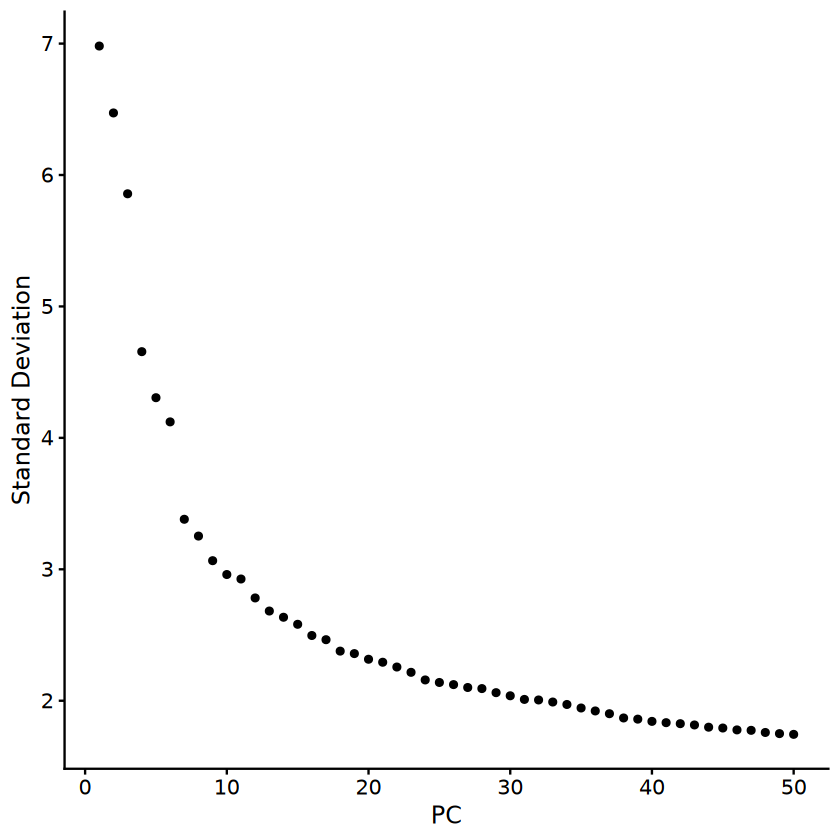

In [16]:
ElbowPlot(so, ndims = 50)

In [17]:
so <- RunUMAP(so, dims = 1:50, verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



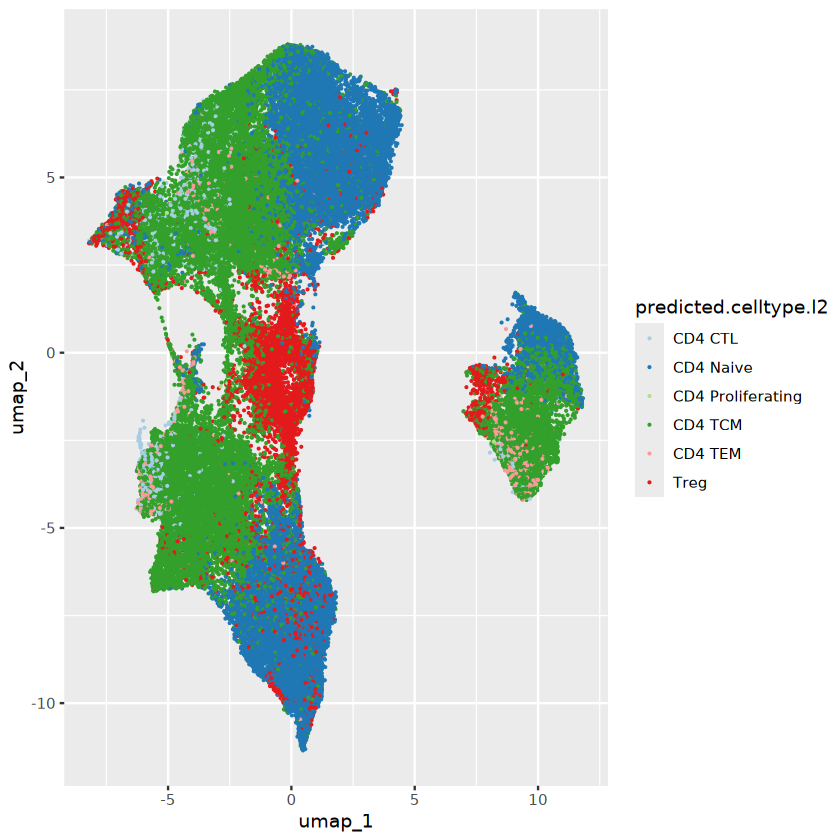

In [18]:
umap_df <- as.data.frame(so@reductions$umap@cell.embeddings)
umap_df <- cbind(so@meta.data, umap_df)

ggplot() +
  geom_point(
      data = umap_df,
      aes(x = umap_1,
          y = umap_2,
          color = predicted.celltype.l2),
      size = 0.1
  ) +
  scale_color_brewer(
      type = "qual",
      palette = 3
  )

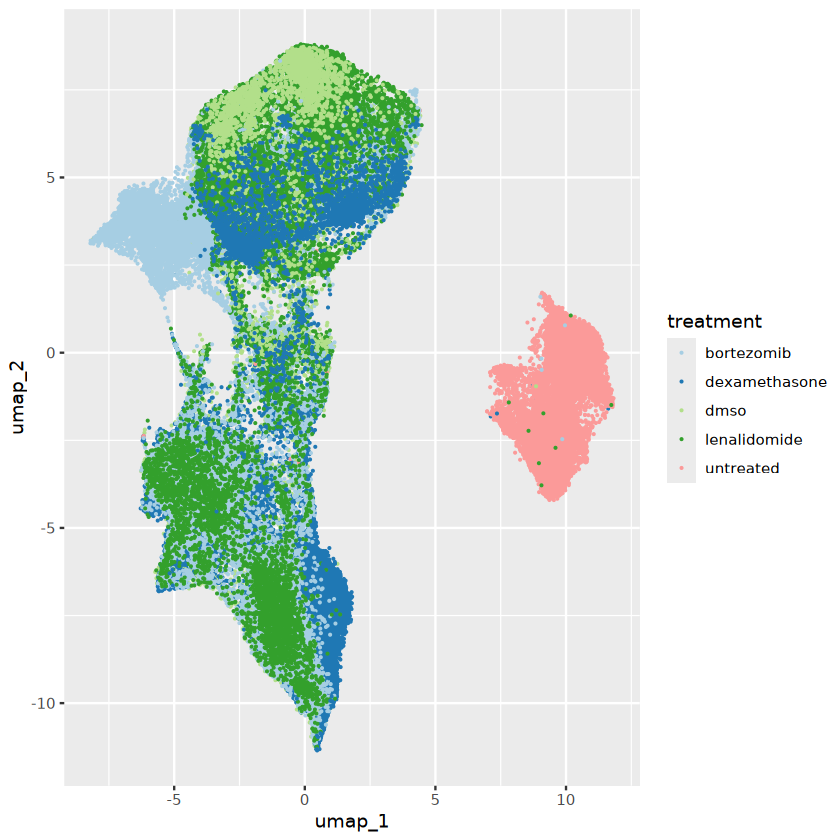

In [19]:
ggplot() +
  geom_point(
      data = umap_df,
      aes(x = umap_1,
          y = umap_2,
          color = treatment),
      size = 0.1
  ) +
  scale_color_brewer(
      type = "qual",
      palette = 3
  )

## Integration, clustering, and marker-based labeling

The label transfer appears to work broadly, but there's a lot of mixing of cells in the reduced dimensionality space. This could be due the treatment conditions causing gene variability that is unrelated to cell type. It appears that regression in `SCTransform()` above was not able to remove this variability.

Below, we'll try a related approach - integrating samples within the dataset on Log Normalized data - to get cleaner grouping of cells based on cell type rather than treatment.

### Split all treat-times

In [20]:
full_so <- readRDS("cache/0215838f-38b2-4f72-b94f-c3e4bbb7137d/filtered_cd4_te_seurat.rds")

In [21]:
full_so$treat_time <- paste0(full_so$treatment, "_", full_so$timepoint)

In [22]:
table(full_so$treat_time)


   bortezomib_24     bortezomib_4    bortezomib_72 dexamethasone_24 
           13476            11503             3903             3331 
 dexamethasone_4          dmso_24           dmso_4          dmso_72 
           21209            17395             8485             2306 
 lenalidomide_24   lenalidomide_4  lenalidomide_72      untreated_0 
            8885             4422             5539            14092 

For integration and labeling, we'll use a subset of 2000 cells from each sample, then use those cells to label the full set of cells from each condition.

In [23]:
sample_cells <- 2000

In [24]:
split_so <- map(
    unique(full_so$treat_time),
    function(tt) {
        set.seed(3030)
        
        sel_so <- full_so[,full_so$treat_time == tt]
        sel_so[,sample(1:ncol(sel_so), sample_cells)]
    }
)

In [25]:
map_int(split_so, ncol)

[1] 2000 2000 2000 2000 2000 2000 2000 2000 2000 2000 2000 2000

### Normalize and integrate data across samples

In [26]:
split_so <- map(
    split_so,
    function(so) {
        DefaultAssay(so) <- "RNA"
        so
    })

In [27]:
split_so <- map(
    split_so,
    function(so) {
        so <- NormalizeData(so)
        so <- FindVariableFeatures(so, nfeatures = 5000)
        so
    })

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts

Normalizing layer: counts

Finding variable features for layer counts



In [28]:
length(split_so)

[1] 12

In [29]:
split_anchors <- FindIntegrationAnchors(
    object.list = split_so, 
    dims = 1:30,
    verbose = FALSE
)

In [30]:
integ_so <- IntegrateData(
    anchorset = split_anchors, 
    dims = 1:30,
    verbose = FALSE
)

Warning message:
“Different cells in new layer data than already exists for scale.data”
Warning message:
“Different cells in new layer data than already exists for scale.data”
Warning message:
“Different cells in new layer data than already exists for scale.data”
Warning message:
“Different cells in new layer data than already exists for scale.data”


In [31]:
DefaultAssay(integ_so) <- "integrated"

In [32]:
integ_so <- ScaleData(integ_so)
integ_so <- RunPCA(integ_so, verbose = FALSE)

Centering and scaling data matrix



In [33]:
integ_so <- RunUMAP(integ_so, dims = 1:30, verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



Let's add labels from the label transfer, above.

In [34]:
pred_labels <- so@meta.data %>%
  select(barcodes, predicted.celltype.l2)
integ_meta <- integ_so@meta.data
integ_meta <- integ_meta %>%
  left_join(pred_labels)
rownames(integ_meta) <- integ_meta$barcodes
integ_so@meta.data <- integ_meta

Joining with `by = join_by(barcodes)`


In [35]:
integ_umap_df <- as.data.frame(integ_so@reductions$umap@cell.embeddings)
integ_umap_df <- cbind(integ_so@meta.data, integ_umap_df)

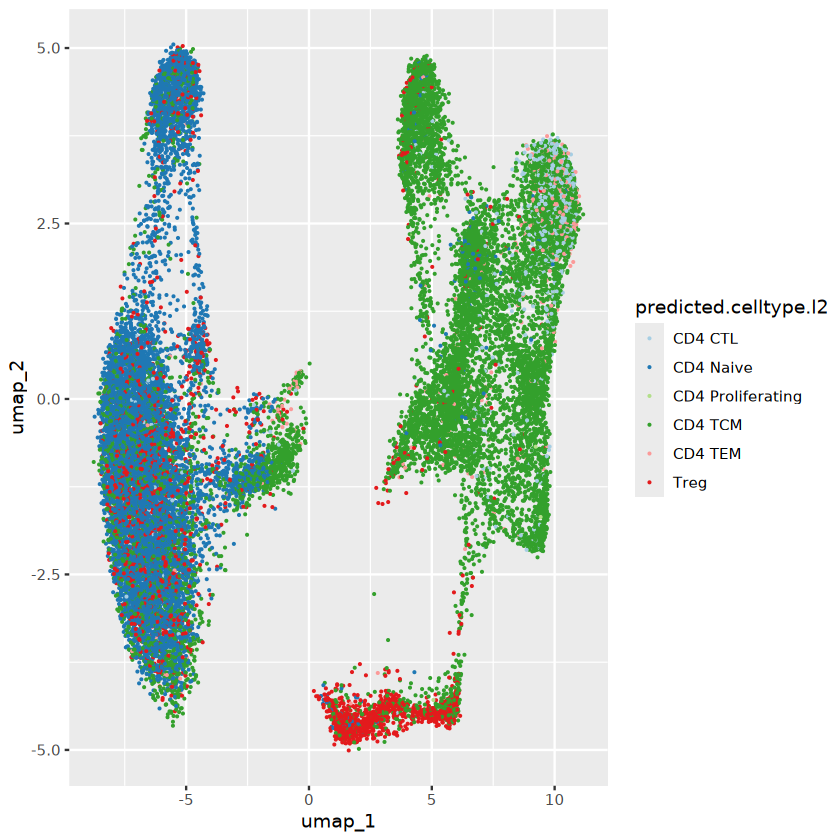

In [36]:
ggplot() +
  geom_point(
      data = integ_umap_df,
      aes(x = umap_1,
          y = umap_2,
          color = predicted.celltype.l2),
      size = 0.1
  ) +
  scale_color_brewer(
      type = "qual",
      palette = 3
  )

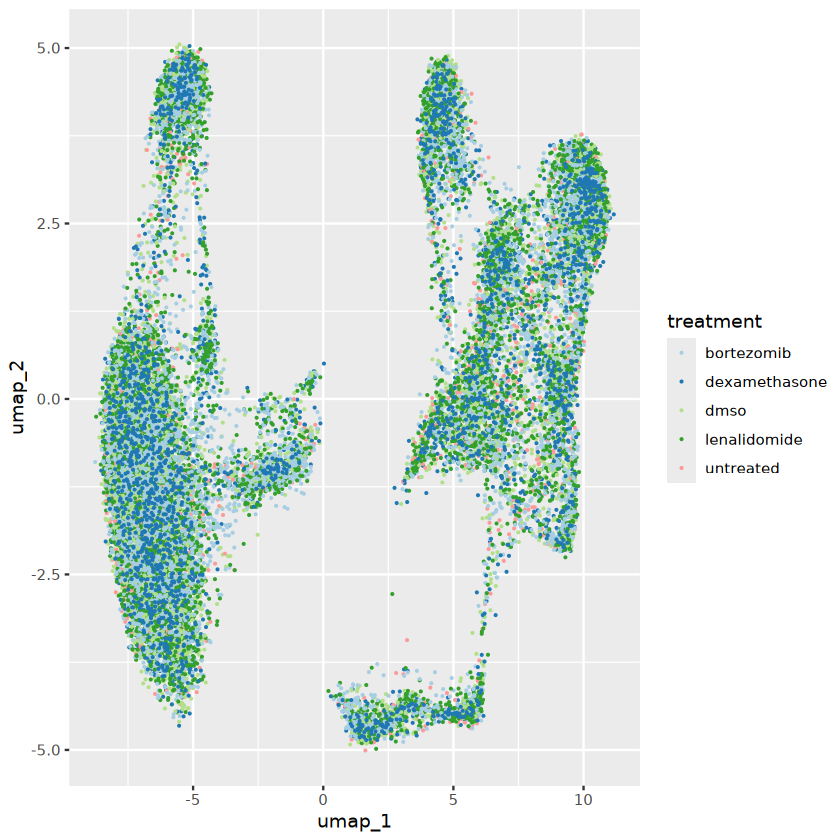

In [37]:
ggplot() +
  geom_point(
      data = integ_umap_df,
      aes(x = umap_1,
          y = umap_2,
          color = treatment),
      size = 0.1
  ) +
  scale_color_brewer(
      type = "qual",
      palette = 3
  )

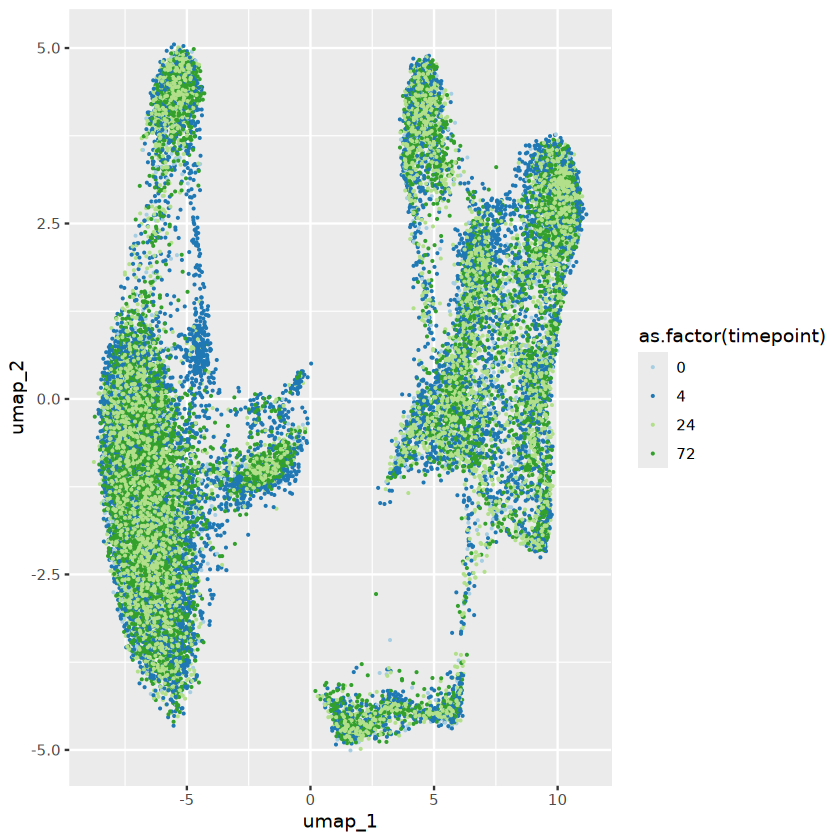

In [38]:
ggplot() +
  geom_point(
      data = integ_umap_df,
      aes(x = umap_1,
          y = umap_2,
          color = as.factor(timepoint)),
      size = 0.1
  ) +
  scale_color_brewer(
      type = "qual",
      palette = 3
  )

### Cluster and assign types

Next, we'll cluster the cells and then plot markers to assign T cell types.

In [39]:
integ_so <- FindNeighbors(integ_so, dims = 1:30, verbose = FALSE)
integ_so <- FindClusters(integ_so, verbose = FALSE)

In [40]:
integ_umap_df <- as.data.frame(integ_so@reductions$umap@cell.embeddings)
integ_umap_df <- cbind(integ_so@meta.data, integ_umap_df)

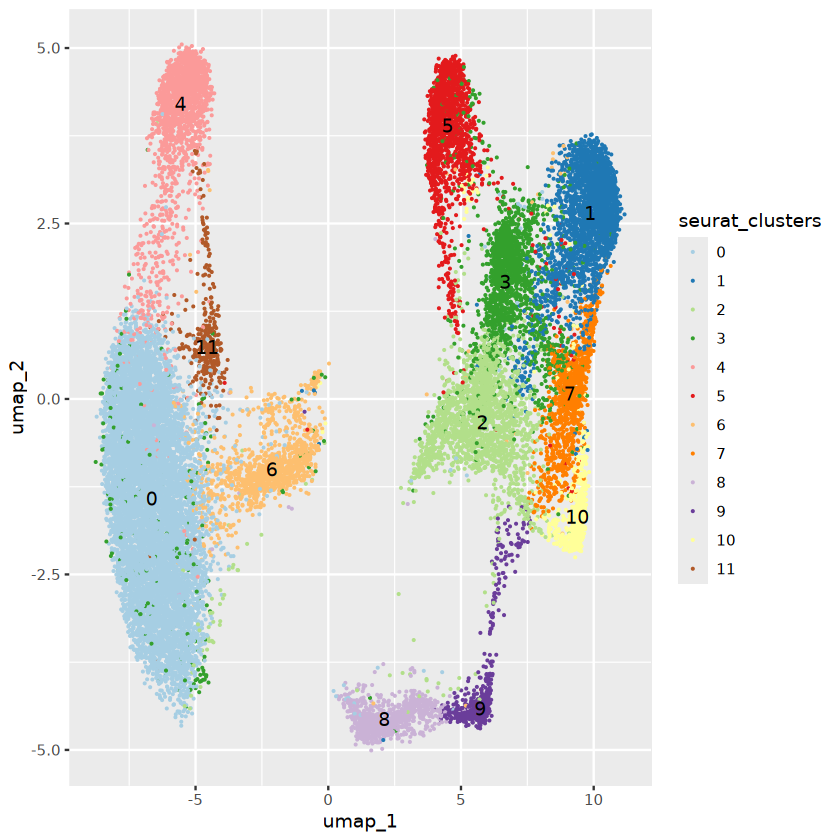

In [41]:
ggplot() +
  geom_point(
      data = integ_umap_df,
      aes(x = umap_1,
          y = umap_2,
          color = seurat_clusters),
      size = 0.1
  ) +
  geom_text(
      data = integ_umap_df %>%
        group_by(seurat_clusters) %>%
        summarise(umap_1 = median(umap_1),
                  umap_2 = median(umap_2),
                  .groups = "keep"),
      aes(x = umap_1,
          y = umap_2,
          label = seurat_clusters)
  ) +
  scale_color_brewer(
      type = "qual",
      palette = 3
  )

To plot ADT markers, we'll normalize counts using CLR.

In [42]:
DefaultAssay(integ_so) <- "ADT"
integ_so <- NormalizeData(
    integ_so, 
    normalization.method = "CLR",
    margin = 2
)

Normalizing across cells



In [43]:
rownames(integ_so)

[1] "CD11c"                   "CD278"                  
 [3] "CD11b"                   "CD16"                   
 [5] "CD21"                    "CD27"                   
 [7] "CD304"                   "CD38"                   
 [9] "CD71"                    "CD86"                   
[11] "HLA.DR"                  "TCR.Va7.2"              
[13] "CD127"                   "CD39"                   
[15] "CD25"                    "CD4"                    
[17] "CD56"                    "CD161"                  
[19] "CD85j"                   "CX3CR1"                 
[21] "CD185"                   "CD152"                  
[23] "CD194"                   "CD196"                  
[25] "CD244"                   "CD26"                   
[27] "CD49d"                   "CD294"                  
[29] "CD279"                   "CD8a"                   
[31] "CD103"                   "CD57"                   
[33] "CD69"                    "CD366"                  
[35] "CD172a"                  "CD192"                  
[37] "CD45RA"                  "CD95"                   
[39] "KLRG1"                   "CD137"                  
[41] "CD183"                   "CD80"                   
[43] "TCR.G.D"                 "CD40"                   
[45] "TCR.A.B"                 "CD197"                  
[47] "CD28"                    "CD45RO"                 
[49] "TIGIT"                   "CD134"                  
[51] "CD154"                   "TCR.VA24.JA18.iNKT.cell"
[53] "CD24"                    "CD319"                  
[55] "IgG1.K.Isotype.Control"

In [44]:
DefaultAssay(integ_so) <- "ADT"
markers <- FindMarkers(integ_so, ident.1 = "3", ident.2 = "0", logfc.threshold = 0)
markers %>%
  arrange(desc(avg_log2FC)) %>%
  head()

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD161,4.988982e-204,0.8715066,0.960,0.917,2.743940e-202
CD69,3.728754e-60,0.5275946,0.997,0.997,2.050815e-58
CD49d,0.000000e+00,0.4823462,1.000,1.000,0.000000e+00
CD95,0.000000e+00,0.4648476,1.000,1.000,0.000000e+00
CD71,6.007998e-11,0.3391088,0.875,0.848,3.304399e-09
CD25,5.990089e-27,0.3019864,0.981,0.963,3.294549e-25


In [45]:
DefaultAssay(integ_so) <- "RNA"
integ_so <- JoinLayers(integ_so, layers = c("counts","data","scale.data"))

In [46]:
markers <- FindMarkers(integ_so, slot = "data",ident.1 = "3", ident.2 = "0", logfc.threshold = 0)
markers$diff <- markers$pct.1 - markers$pct.2
markers %>%
  arrange(desc(diff)) %>%
  head(10)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,diff
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ADAM19,0.000000e+00,3.9168634,0.501,0.044,0.000000e+00,0.457
PHACTR2,1.501684e-244,1.6513037,0.584,0.219,5.496314e-240,0.365
ARAP2,5.597031e-220,1.6184187,0.696,0.357,2.048569e-215,0.339
MAF,0.000000e+00,2.7966565,0.394,0.058,0.000000e+00,0.336
UST,0.000000e+00,4.3899063,0.348,0.024,0.000000e+00,0.324
GPRIN3,1.722058e-145,0.9884266,0.730,0.416,6.302903e-141,0.314
ITGB1,3.152560e-215,1.9764204,0.481,0.172,1.153868e-210,0.309
ATXN1,1.900477e-171,1.2629503,0.790,0.485,6.955935e-167,0.305
CMTM6,4.260262e-170,1.5142912,0.536,0.236,1.559298e-165,0.300


In [47]:
markers %>%
  arrange(diff) %>%
  head(10)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,diff
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UBE2E2,1.129740e-135,-2.2002213,0.111,0.405,4.134961e-131,-0.294
IGF1R,4.006699e-203,-1.2317529,0.539,0.831,1.466492e-198,-0.292
DACT1,1.301925e-125,-3.1110681,0.050,0.310,4.765177e-121,-0.260
TSHZ2,2.882442e-79,-0.8738504,0.438,0.658,1.055002e-74,-0.220
MAN1C1,1.288072e-83,-1.1053772,0.354,0.562,4.714474e-79,-0.208
TTN,2.571519e-84,-2.1427715,0.100,0.306,9.412017e-80,-0.206
LRRN3,4.483669e-78,-2.2730084,0.069,0.261,1.641068e-73,-0.192
PLCL1,1.410129e-94,-1.0312046,0.574,0.762,5.161213e-90,-0.188
CERS6,1.024210e-61,-1.0431601,0.275,0.461,3.748713e-57,-0.186


In [48]:
type_markers <- c(
    "UBE2E2", # CD4 Naive 
    "MAF", # CD4 Memory
    "CCL5", # CD4 EM
    "FOXP3" # CD4 Treg
)

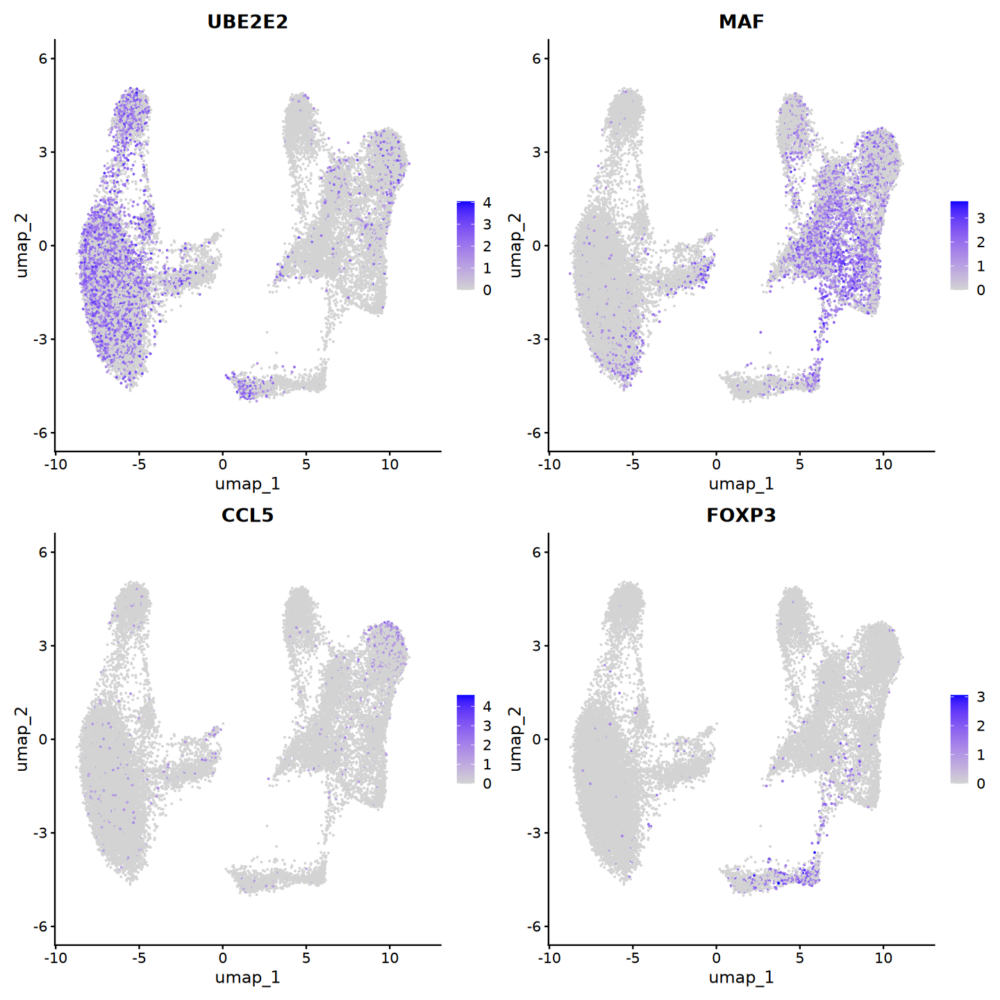

In [49]:
options(repr.plot.width = 12, repr.plot.height = 12)
FeaturePlot(integ_so, features = type_markers)

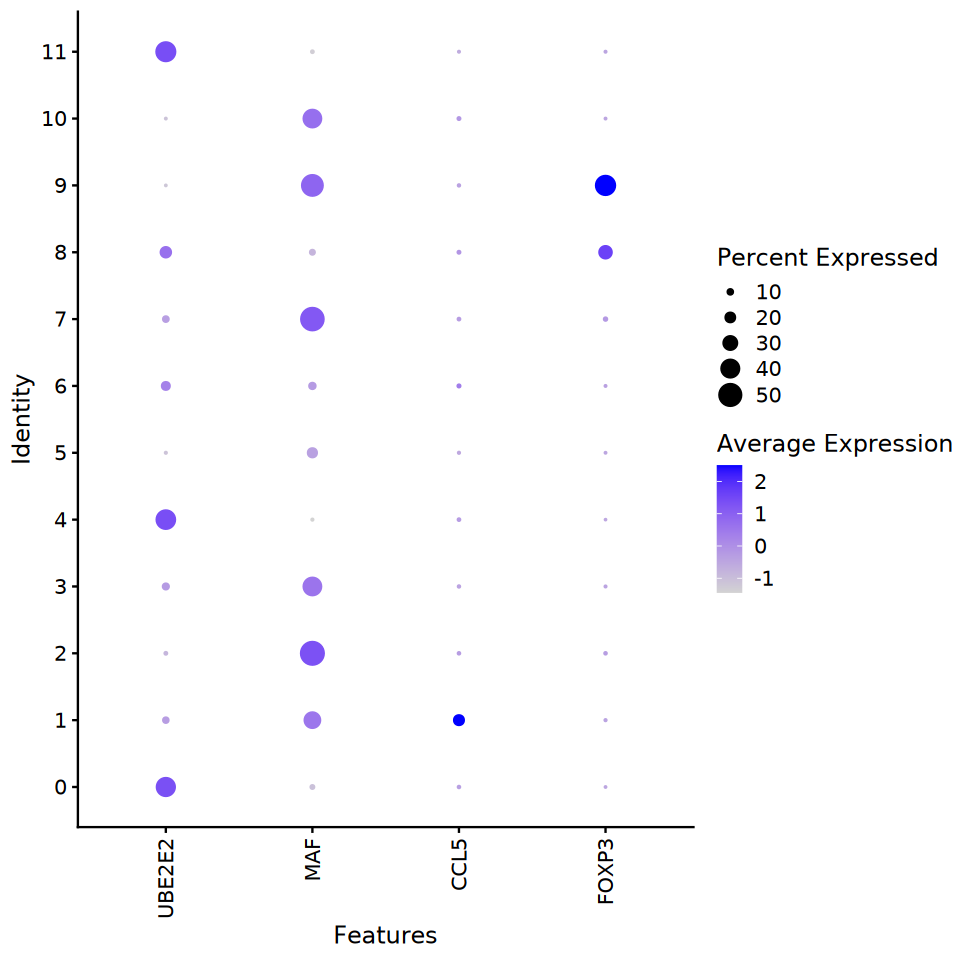

In [50]:
options(repr.plot.width = 8, repr.plot.height = 8)
DotPlot(
    integ_so,
    features = type_markers,
    group.by = "seurat_clusters"
)  +
  ggplot2::theme(axis.text.x = ggplot2::element_text(angle = 90, hjust = 1, vjust = 0.5))

We'll apply these cutoffs to assign cell types

In [51]:
# Naive CD4:
ube2e2_cutoff <- 0.15
# CD4 CM:
maf_cutoff <- 0.15
# CD4 EM:
ccl5_cutoff <- 0.1
# CD4 Treg
foxp3_cutoff <- 0.1

In [52]:
marker_mat <- integ_so[["RNA"]]@layers$counts[match(type_markers, rownames(integ_so)),]
rownames(marker_mat) <- type_markers
colnames(marker_mat) <- colnames(integ_so)
clusters <- integ_so@meta.data$seurat_clusters

In [53]:
marker_fracs <- map(
    type_markers,
    function(marker) {
        cl_list <- split(marker_mat[marker,], clusters)
        cl_frac <- map_dbl(cl_list, function(x) { sum(x > 0) / length(x) })
        cl_frac
    })
names(marker_fracs) <- type_markers
marker_df <- data.frame(
    cl = names(marker_fracs[[1]]),
    do.call(cbind, marker_fracs)
)

In [54]:
head(marker_df)

,cl,UBE2E2,MAF,CCL5,FOXP3
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
0,0,0.40532064,0.05828917,0.02444036,0.007137450
1,1,0.09879424,0.34461299,0.20497861,0.016336056
2,2,0.03230473,0.52121504,0.02555448,0.026036644
3,3,0.11145038,0.39440204,0.02239186,0.013231552
4,4,0.41530670,0.01631964,0.02870006,0.004501970
5,5,0.01443418,0.18533487,0.01674365,0.008660508


In [55]:
cl_types <- marker_df %>%
  mutate(
      aifi_cell_type = case_when(
          FOXP3 > foxp3_cutoff ~ "t_cd4_treg",
          CCL5 > ccl5_cutoff ~ "t_cd4_em",
          MAF > maf_cutoff ~ "t_cd4_cm",
          UBE2E2 > ube2e2_cutoff ~ "t_cd4_naive"
      )
  )

In [56]:
cl_types

,cl,UBE2E2,MAF,CCL5,FOXP3,aifi_cell_type
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
0,0,0.405320645,0.05828917,0.02444036,0.007137450,t_cd4_naive
1,1,0.098794243,0.34461299,0.20497861,0.016336056,t_cd4_em
2,2,0.032304725,0.52121504,0.02555448,0.026036644,t_cd4_cm
3,3,0.111450382,0.39440204,0.02239186,0.013231552,t_cd4_cm
4,4,0.415306697,0.01631964,0.02870006,0.004501970,t_cd4_naive
5,5,0.014434180,0.18533487,0.01674365,0.008660508,t_cd4_cm
6,6,0.155737705,0.11803279,0.03770492,0.010655738,t_cd4_naive
7,7,0.101964453,0.51075772,0.02993452,0.046772685,t_cd4_cm
8,8,0.217062635,0.08423326,0.03455724,0.266738661,t_cd4_treg


In [57]:
integ_so@meta.data$aifi_cell_type <- cl_types$aifi_cell_type[match(integ_so@meta.data$seurat_clusters, cl_types$cl)]

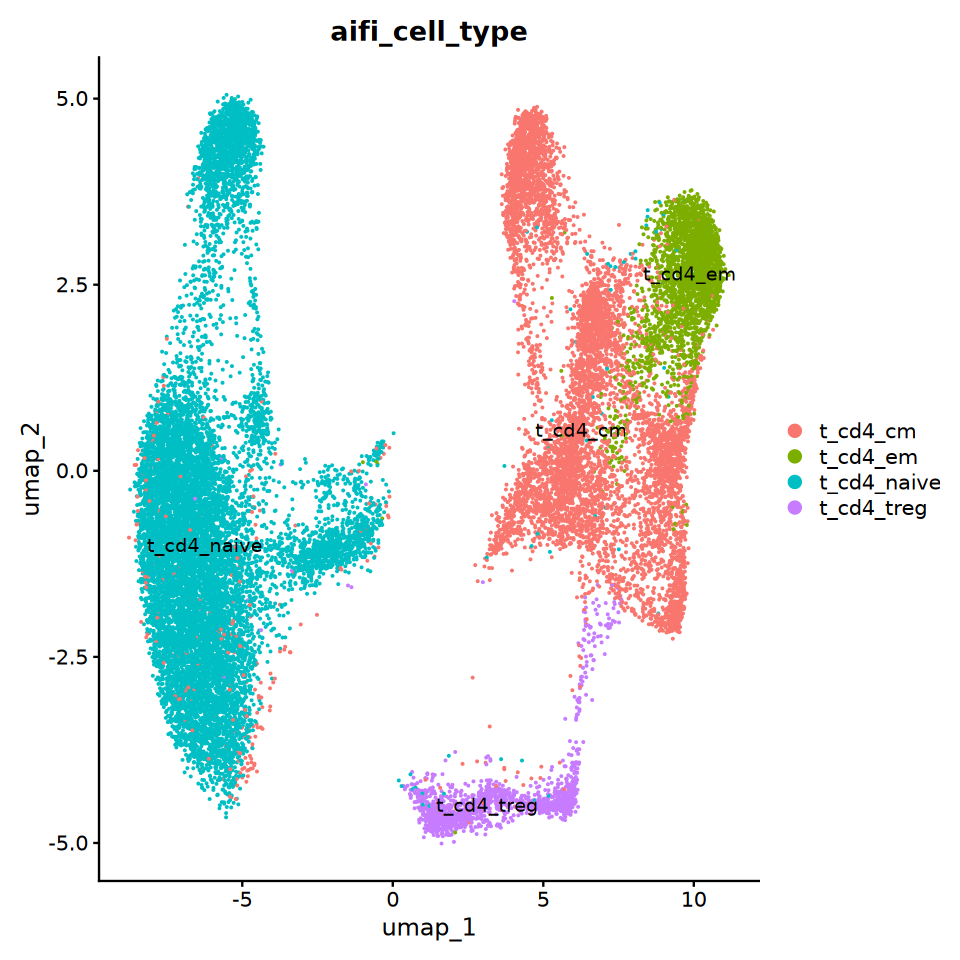

In [58]:
DimPlot(
    integ_so, 
    group.by = "aifi_cell_type",
    label = TRUE
)

### Apply labels to all cells by clustering within each sample

In [59]:
integ_labels <- integ_so@meta.data %>%
  select(barcodes, aifi_cell_type)

In [60]:
split_so <- map(
    unique(full_so$treat_time),
    function(tt) {
        set.seed(3030)
        
        sel_so <- full_so[,full_so$treat_time == tt]
        sel_meta <- sel_so@meta.data
        sel_meta <- sel_meta %>%
          left_join(integ_labels)
        rownames(sel_meta) <- sel_meta$barcodes
        sel_so@meta.data <- sel_meta
        sel_so
    }
)

Joining with `by = join_by(barcodes)`
Joining with `by = join_by(barcodes)`
Joining with `by = join_by(barcodes)`
Joining with `by = join_by(barcodes)`
Joining with `by = join_by(barcodes)`
Joining with `by = join_by(barcodes)`
Joining with `by = join_by(barcodes)`
Joining with `by = join_by(barcodes)`
Joining with `by = join_by(barcodes)`
Joining with `by = join_by(barcodes)`
Joining with `by = join_by(barcodes)`
Joining with `by = join_by(barcodes)`


In [61]:
split_so <- map(
    split_so,
    function(so) {
        message(paste("Processing", so@meta.data$treat_time[1]))
        so <- FindVariableFeatures(so, nfeatures = 4000)
        so <- NormalizeData(so)
        so <- ScaleData(so)
        so <- RunPCA(so, verbose = FALSE)
        so <- FindNeighbors(so, dims = 1:30, verbose = FALSE)
        so <- FindClusters(so, resolution = 1.2, verbose = FALSE)
        so <- RunUMAP(so, dims = 1:30, verbose = FALSE)
        so
    })

Processing dmso_24

Finding variable features for layer counts

Normalizing layer: counts

Centering and scaling data matrix

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Processing dmso_4

Finding variable features for layer counts

Normalizing layer: counts

Centering and scaling data matrix

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Processing dexamethasone_4

Finding variable features for layer counts

Normalizing layer: counts

Centering and scaling data matrix

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cach

A helper function for finding most frequent cell type values within each cluster

In [62]:
mfv <- function(x) {
    x <- x[!is.na(x)]
    t <- table(x)
    t <- t[order(t, decreasing = TRUE)]
    names(t)[1]
}

In [63]:
type_labels <- map(
    split_so,
    function(so) {
        message(paste("Processing", so@meta.data$treat_time[1]))

        meta <- so@meta.data
        meta %>%
          group_by(seurat_clusters) %>%
          mutate(aifi_cell_type = mfv(aifi_cell_type)) %>%
          ungroup() %>%
          select(barcodes, aifi_cell_type)
    })

Processing dmso_24

Processing dmso_4

Processing dexamethasone_4

Processing untreated_0

Processing lenalidomide_72

Processing bortezomib_24

Processing bortezomib_4

Processing lenalidomide_24

Processing dmso_72

Processing lenalidomide_4

Processing bortezomib_72

Processing dexamethasone_24



### Review labels per sample

Let's plot each sample's clustering and labeling to check the labels prior to output

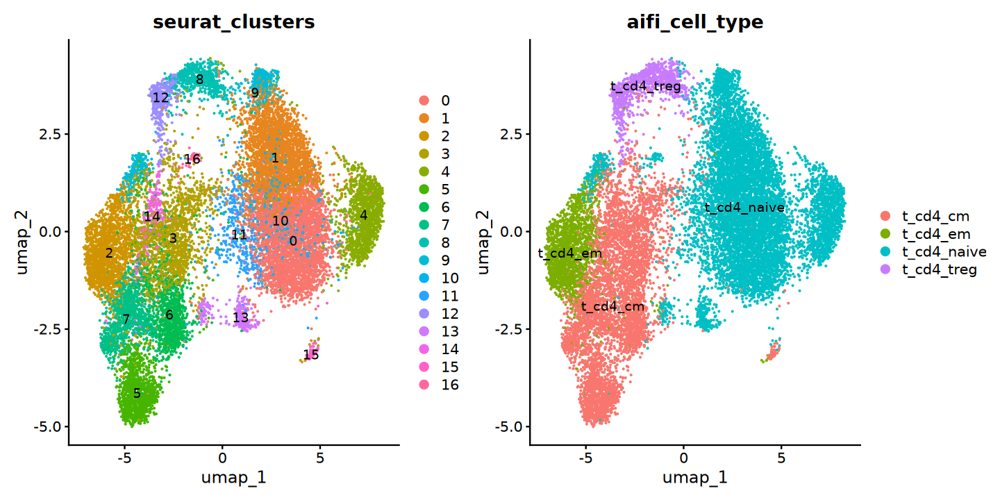

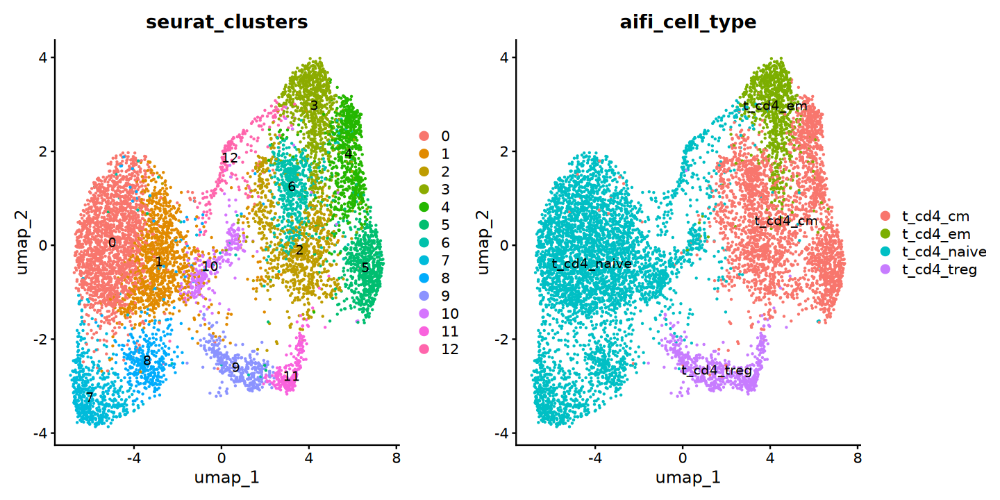

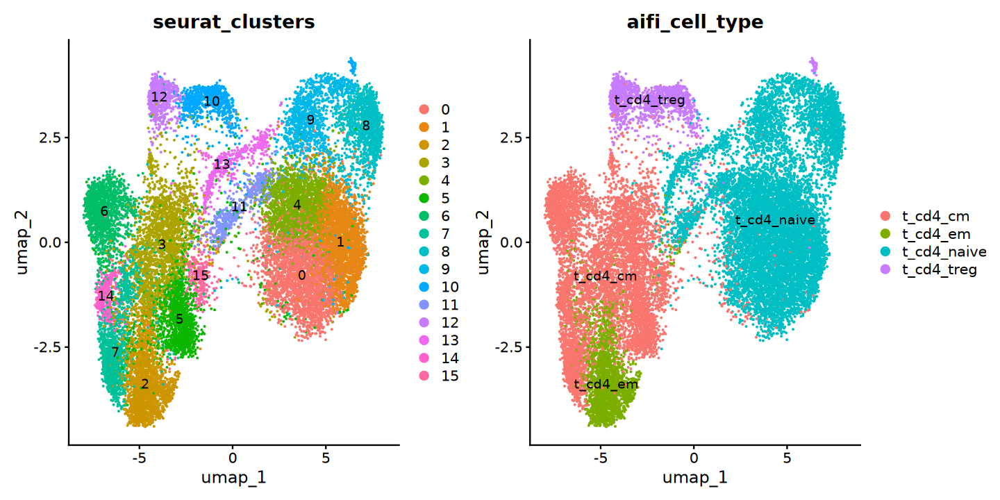

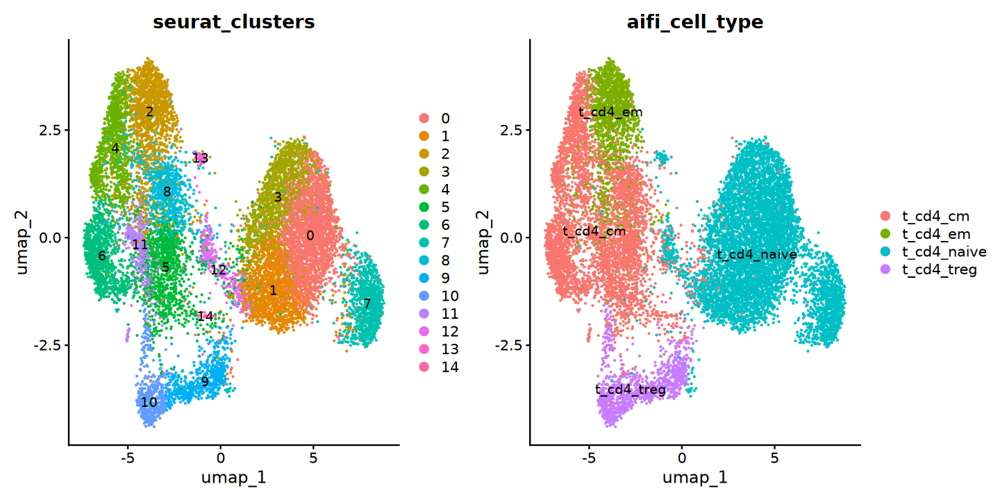

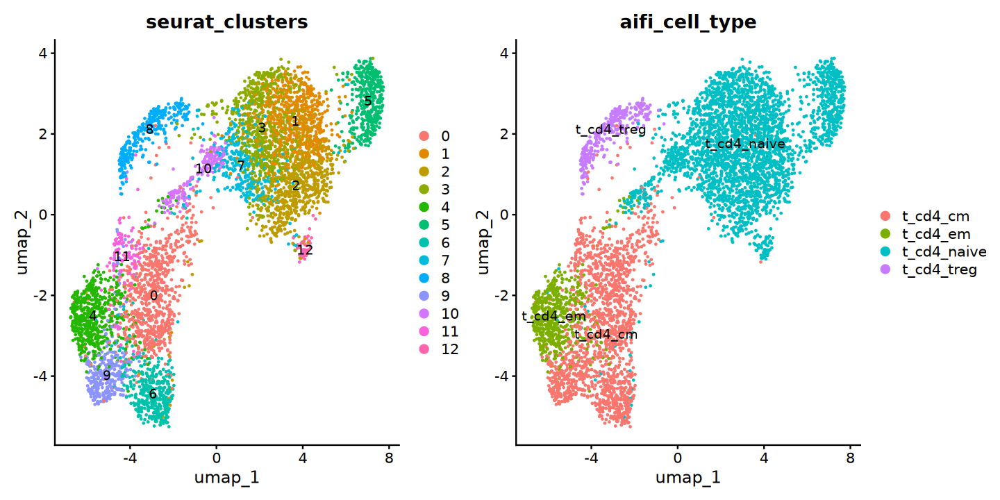

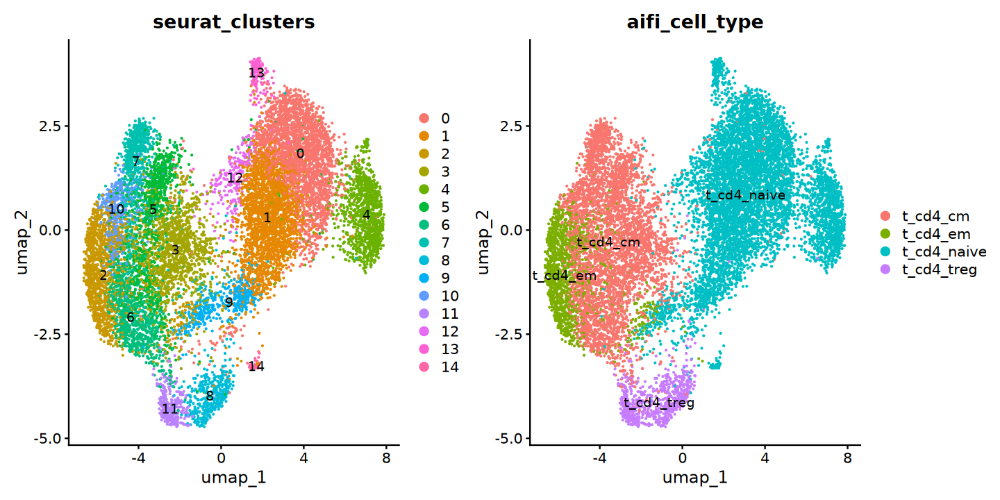

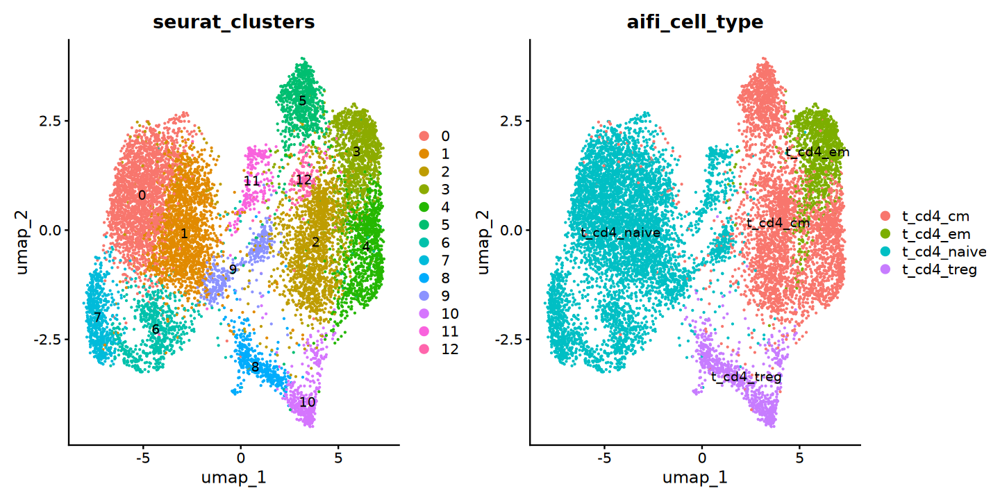

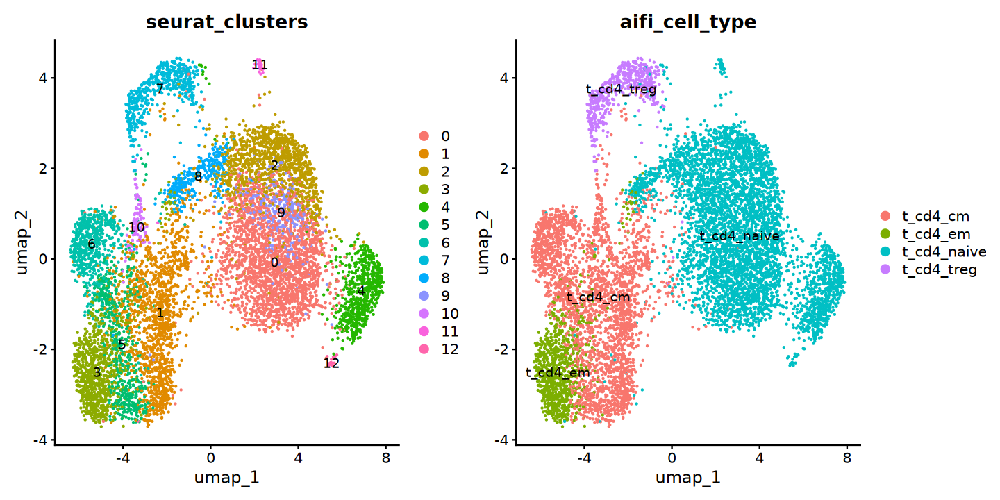

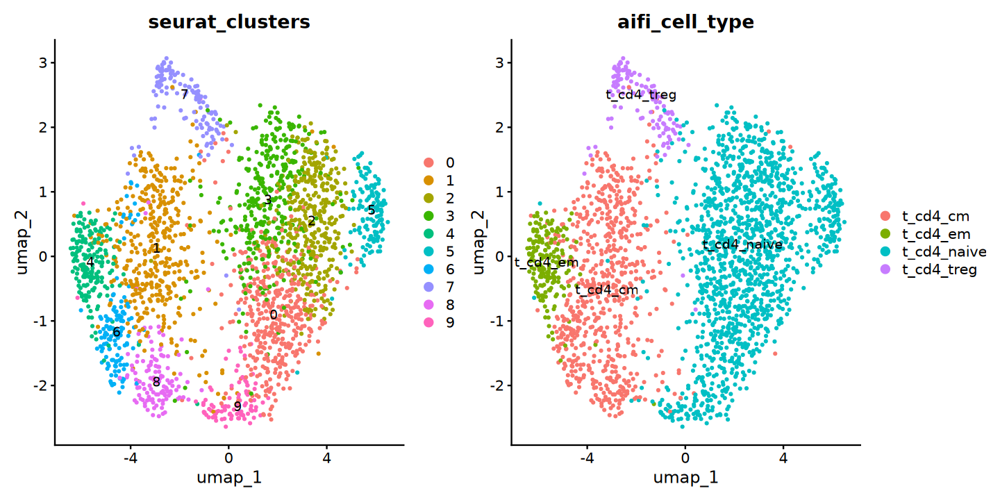

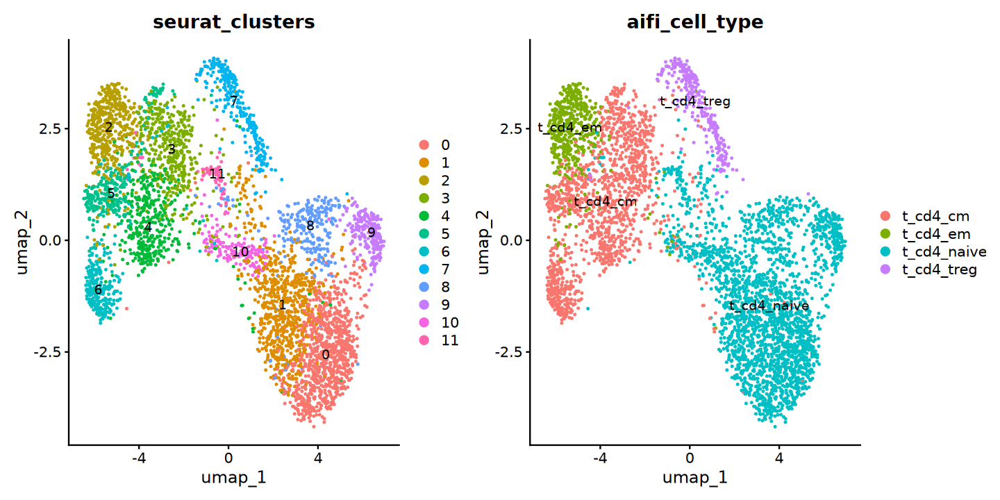

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]


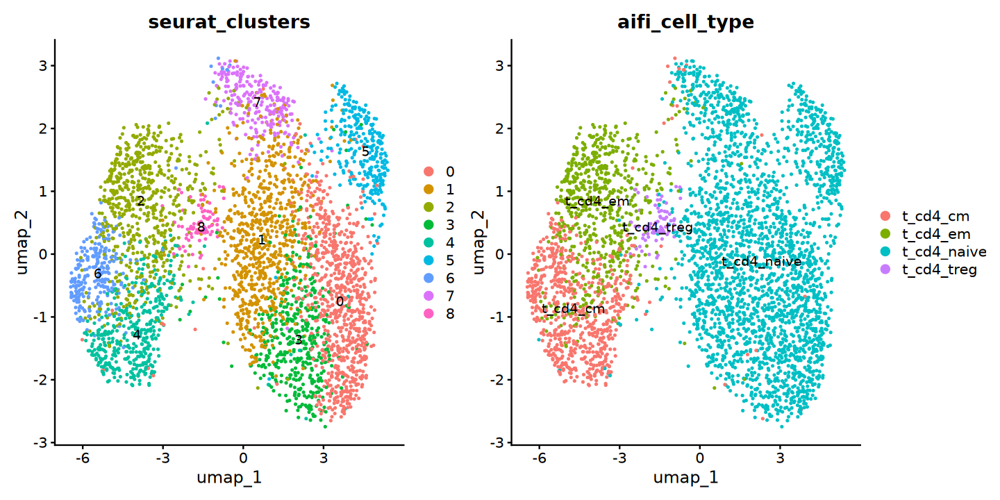

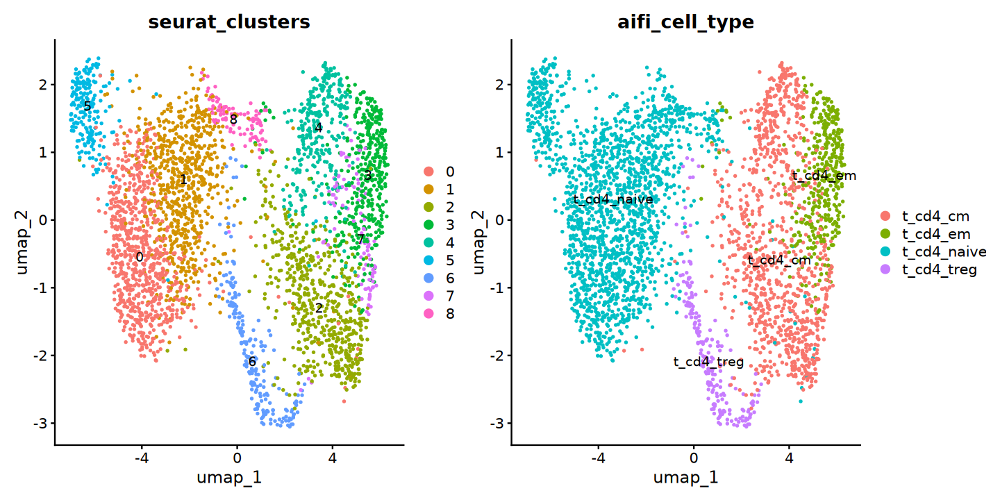

In [64]:
options(repr.plot.width = 12, repr.plot.height = 6)
map2(
    split_so, type_labels,
    function(so, label_df) {
        so@meta.data$aifi_cell_type <- label_df$aifi_cell_type
        DimPlot(so, group.by = c("seurat_clusters","aifi_cell_type"), label = TRUE)
    }    
)

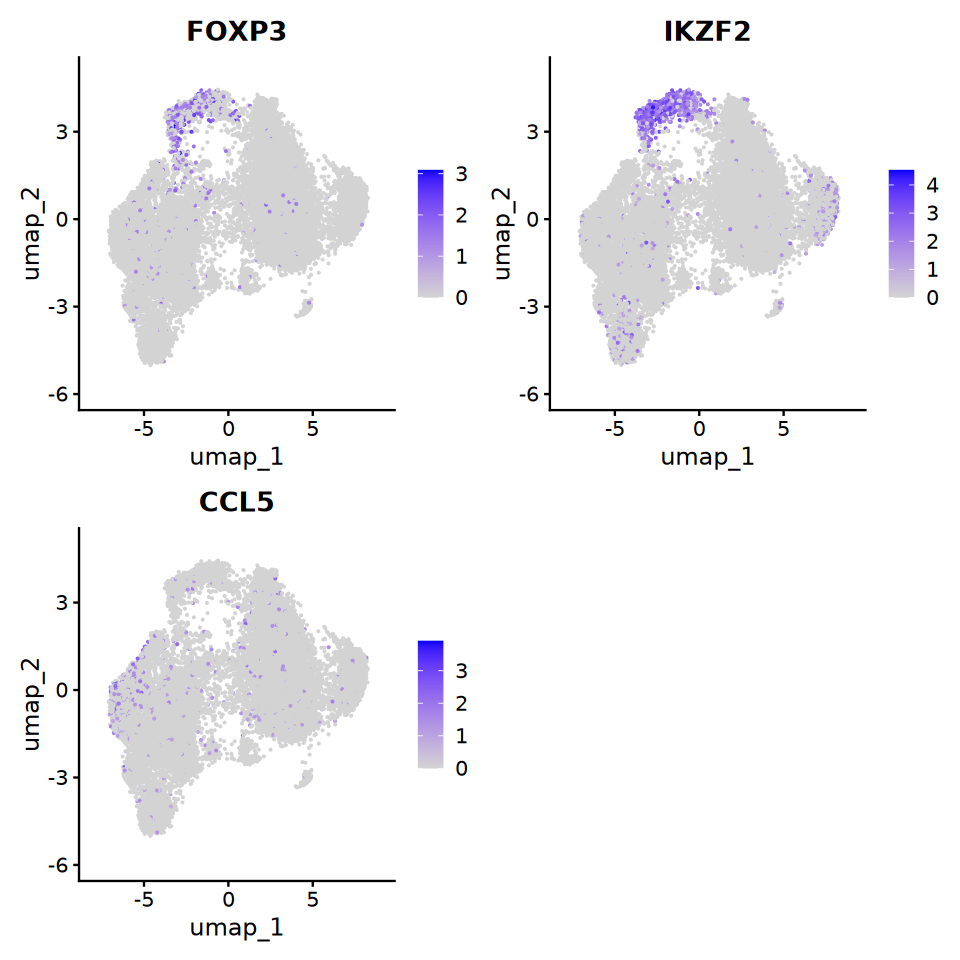

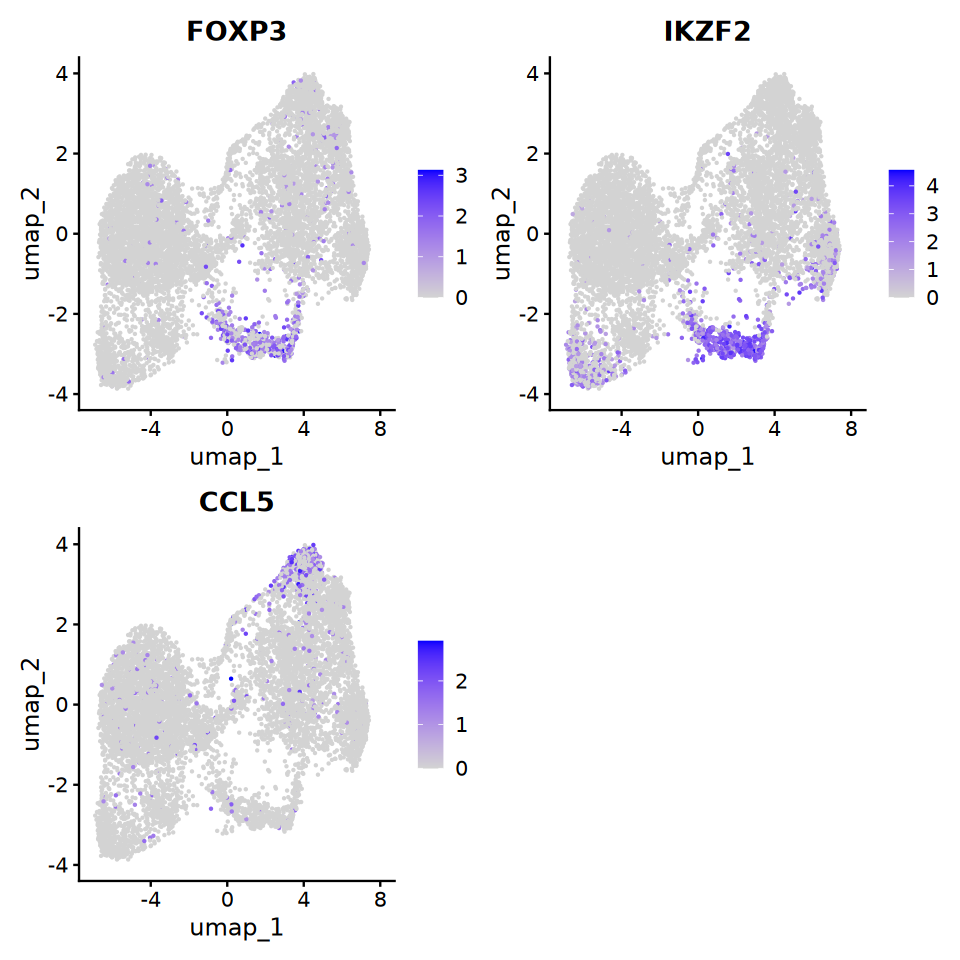

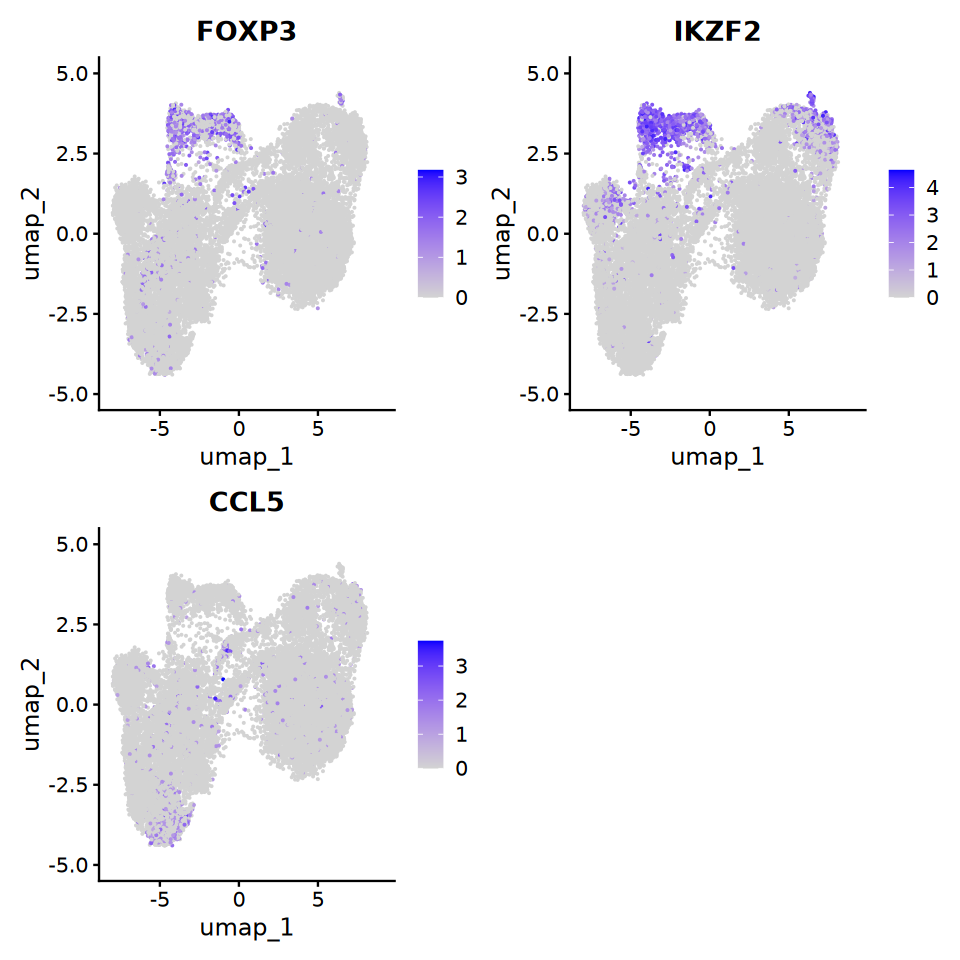

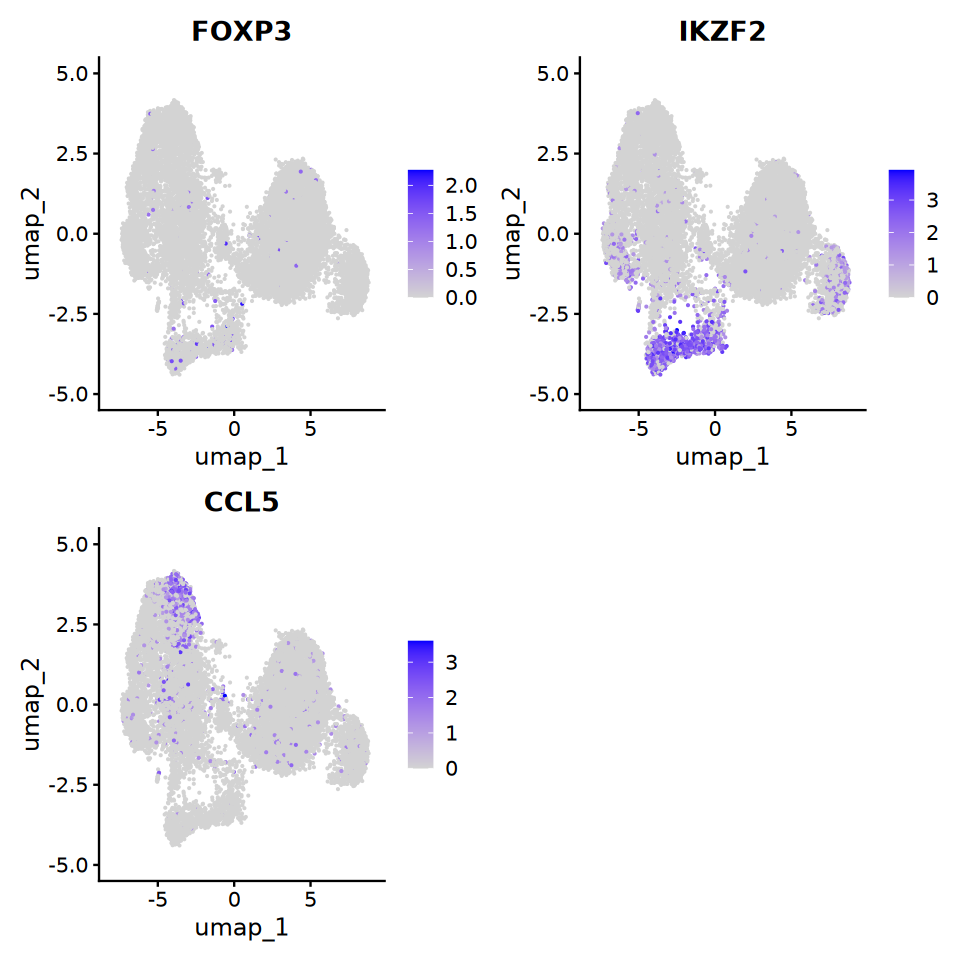

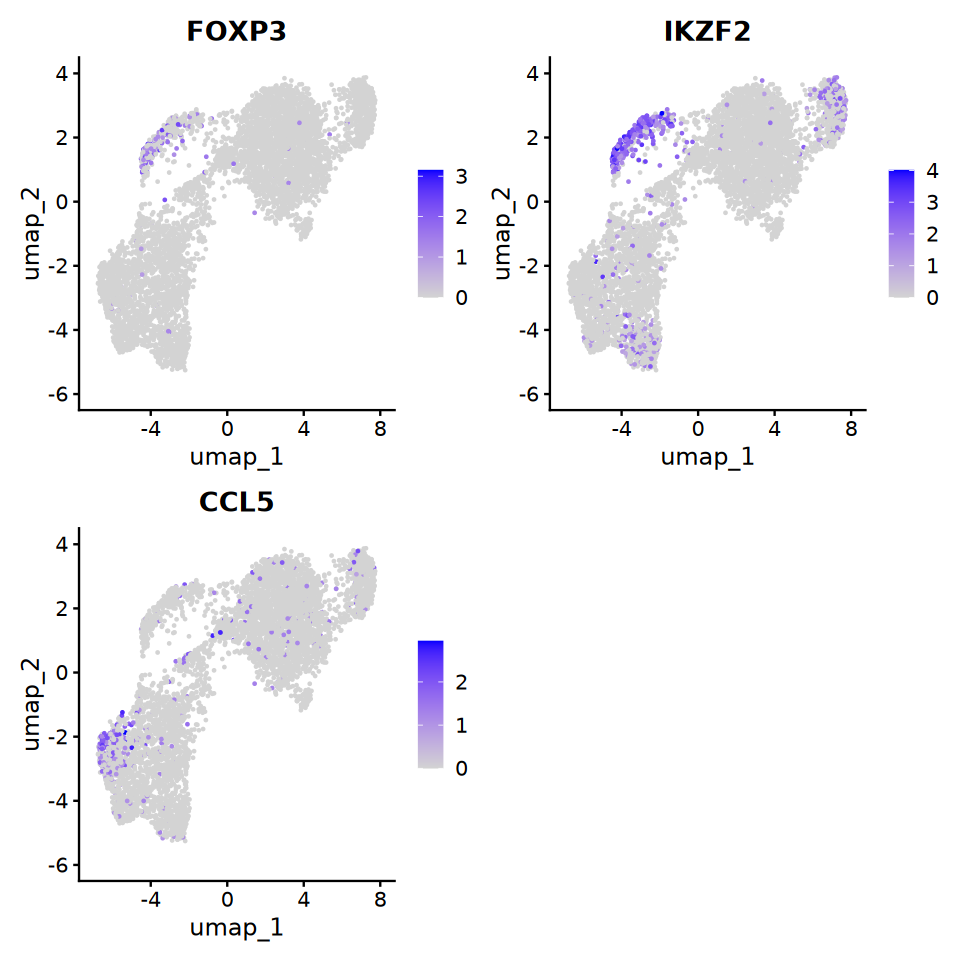

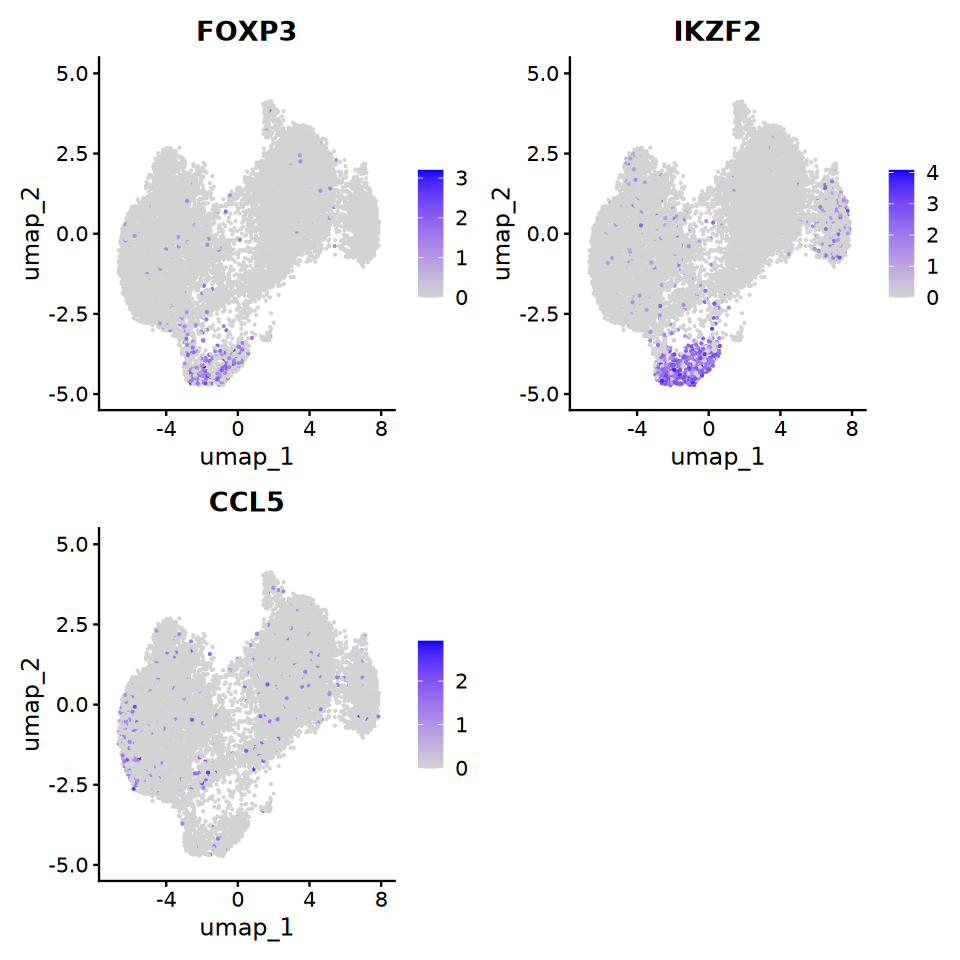

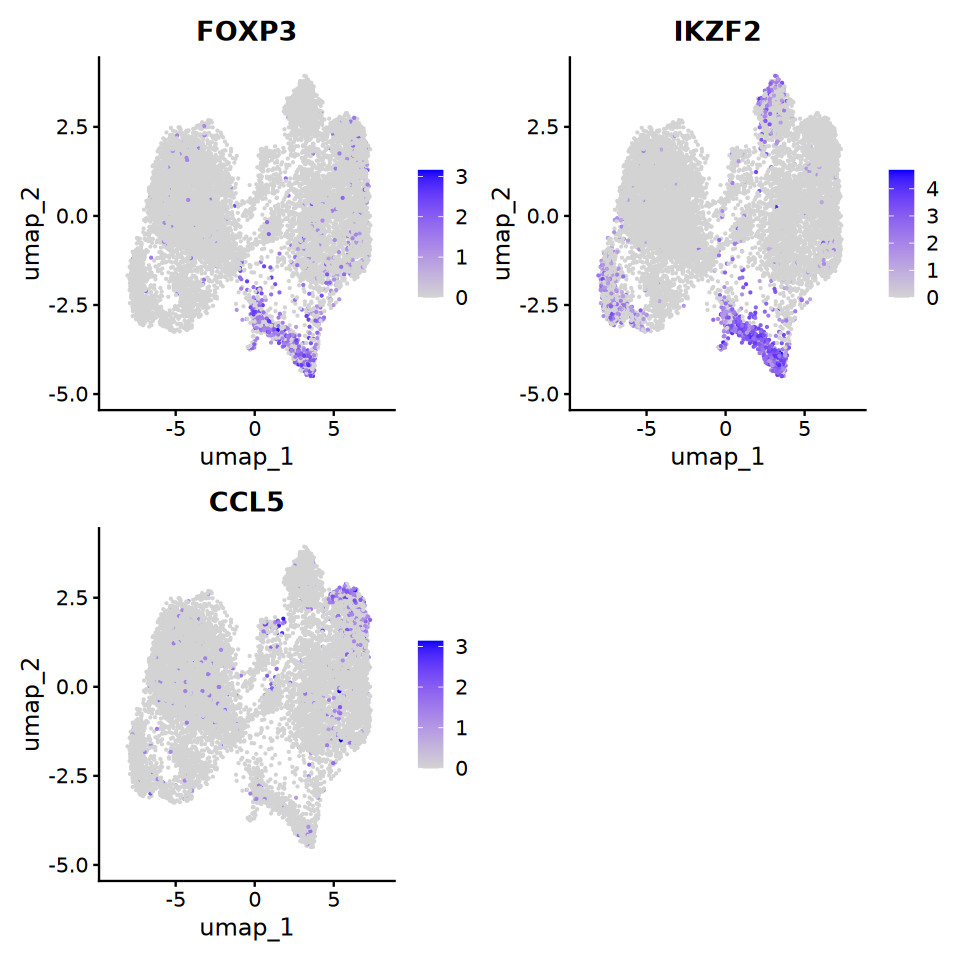

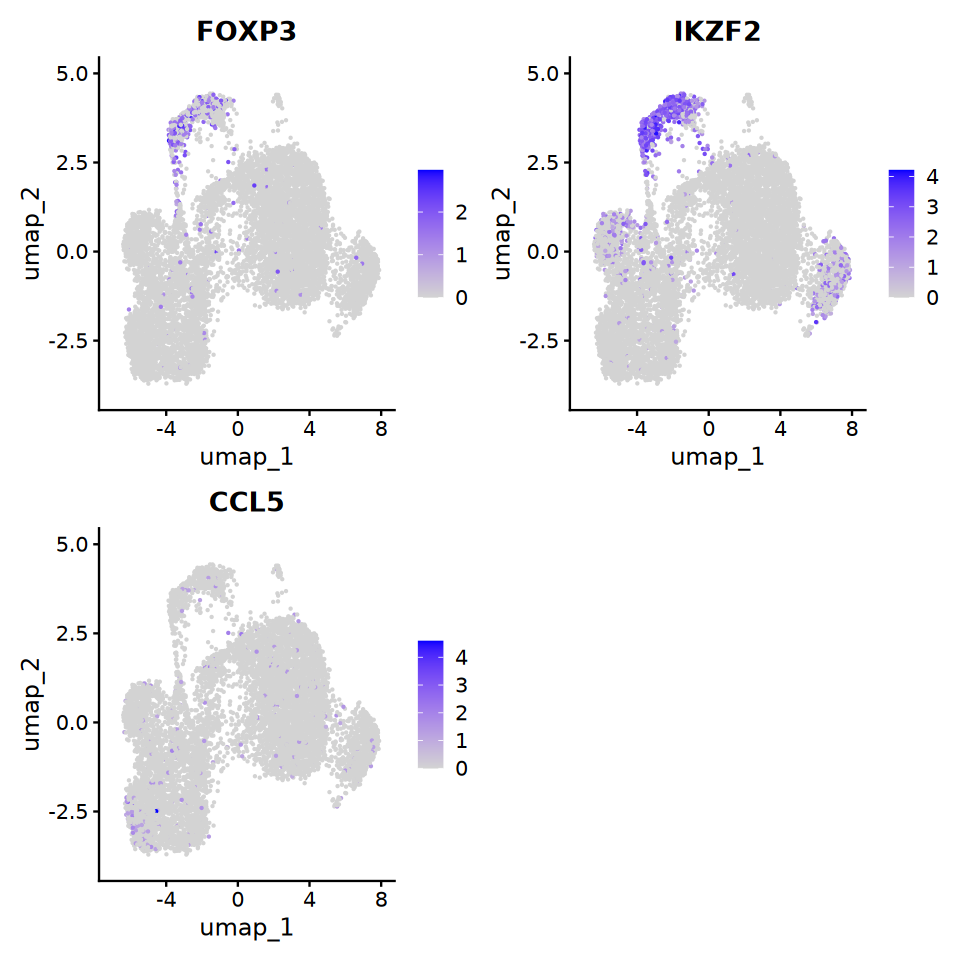

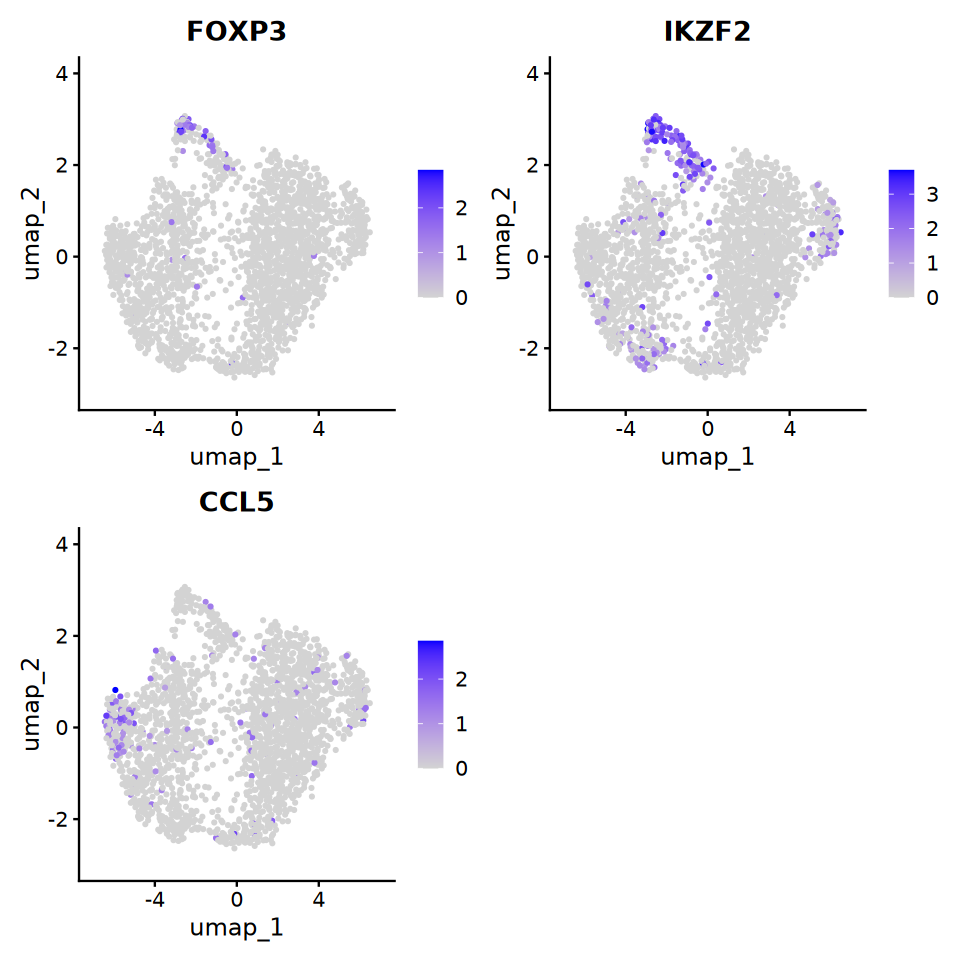

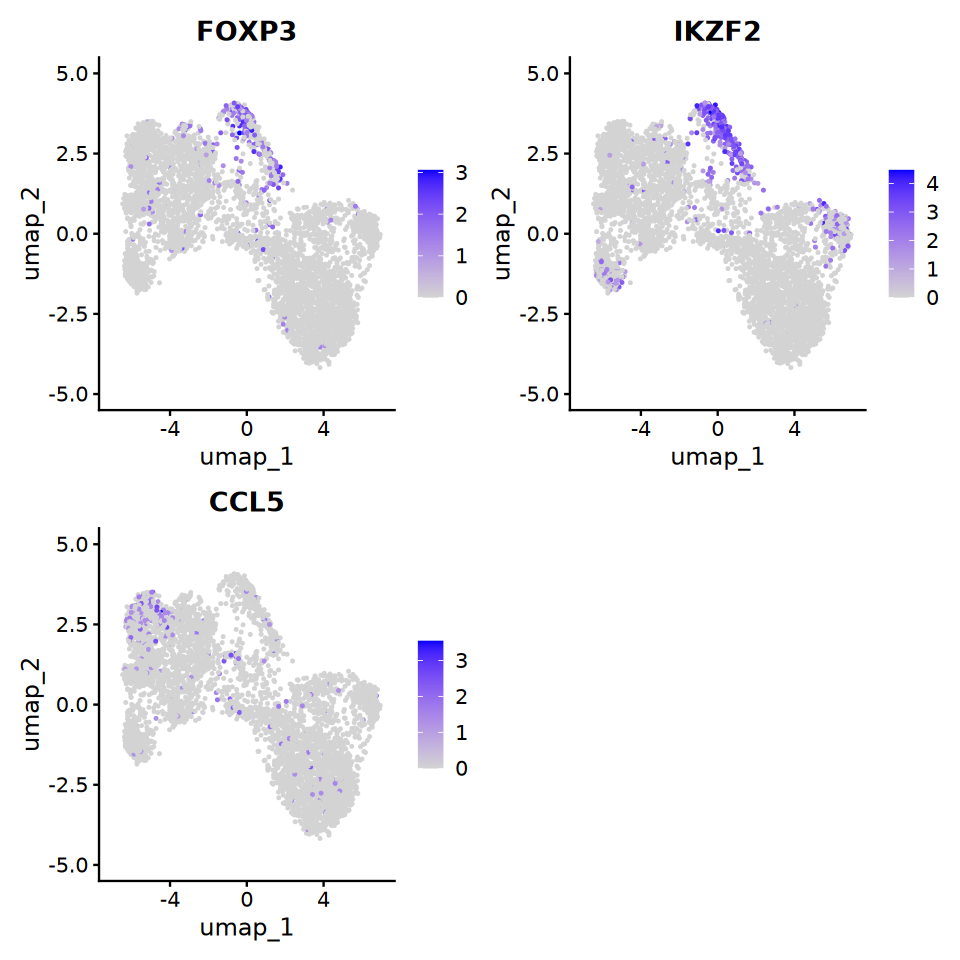

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]


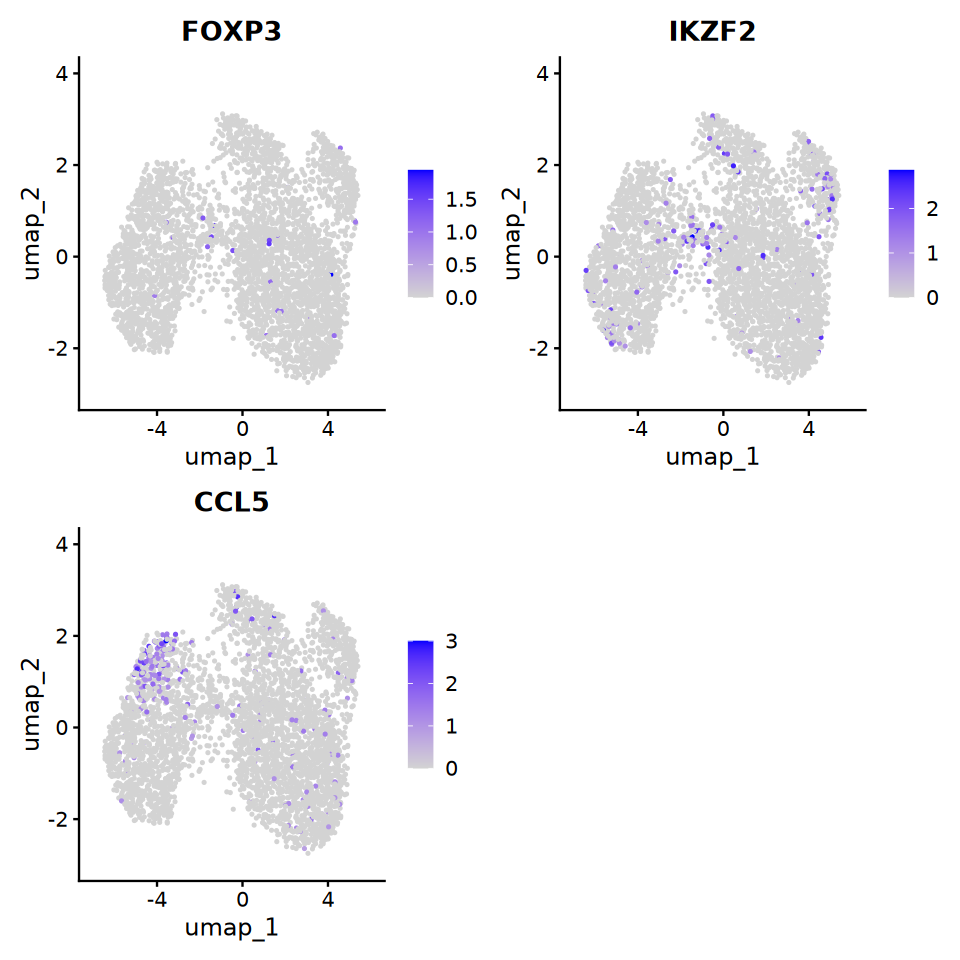

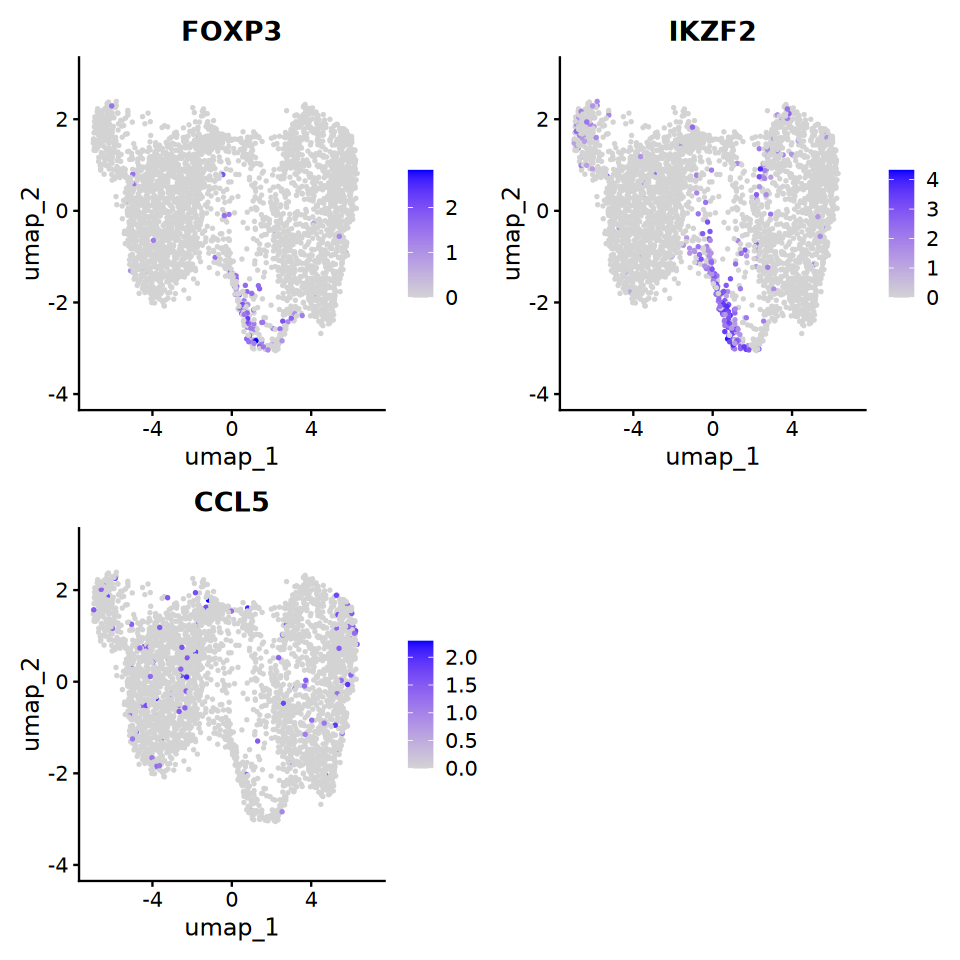

In [65]:
options(repr.plot.width = 8, repr.plot.height = 8)
map2(
    split_so, type_labels,
    function(so, label_df) {
        so@meta.data$aifi_cell_type <- label_df$aifi_cell_type
        FeaturePlot(so, features = c("FOXP3","IKZF2","CCL5"))
    }    
)

Let's transfer these to the full Seurat object and visualize these labels

In [66]:
all_labels <- do.call(rbind, type_labels)

In [67]:
table(all_labels$aifi_cell_type)


   t_cd4_cm    t_cd4_em t_cd4_naive  t_cd4_treg 
      35698       12031       59826        6991 

In [68]:
so_meta <- so@meta.data
so_meta <- so_meta %>%
  left_join(all_labels)
rownames(so_meta) <- so_meta$barcodes
so@meta.data <- so_meta

Joining with `by = join_by(barcodes)`


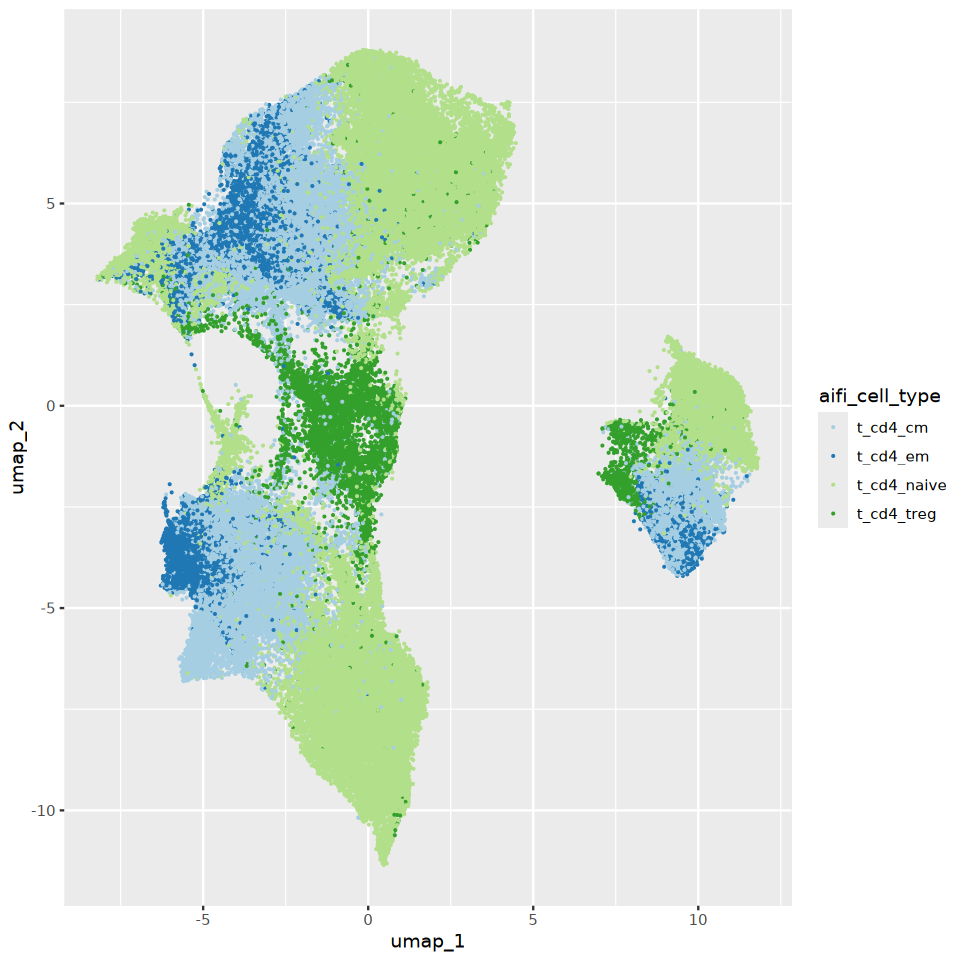

In [81]:
umap_df <- as.data.frame(so@reductions$umap@cell.embeddings)
umap_df <- cbind(so@meta.data, umap_df)

ggplot() +
  geom_point(
      data = umap_df,
      aes(x = umap_1,
          y = umap_2,
          color = aifi_cell_type),
      size = 0.1
  ) +
  scale_color_brewer(
      type = "qual",
      palette = 3
  )

In [82]:
type_counts <- table(
    so_meta$treat_time,
    so_meta$aifi_cell_type
)
type_counts

                  
                   t_cd4_cm t_cd4_em t_cd4_naive t_cd4_treg
  bortezomib_24        4371     1419        6974        712
  bortezomib_4         3562     1214        5953        774
  bortezomib_72         685      657        2483         78
  dexamethasone_24      981      401        1739        210
  dexamethasone_4      7124     2097       10717       1271
  dmso_24              5313     1812        9248       1022
  dmso_4               2679      819        4420        567
  dmso_72               648      180        1352        126
  lenalidomide_24      2742      894        4733        516
  lenalidomide_4       1372      479        2296        275
  lenalidomide_72      1583      578        3059        319
  untreated_0          4638     1481        6852       1121

In [83]:
prop.table(type_counts, 1)

                  
                     t_cd4_cm   t_cd4_em t_cd4_naive t_cd4_treg
  bortezomib_24    0.32435441 0.10529831  0.51751262 0.05283467
  bortezomib_4     0.30965835 0.10553769  0.51751717 0.06728679
  bortezomib_72    0.17550602 0.16833205  0.63617730 0.01998463
  dexamethasone_24 0.29450615 0.12038427  0.52206545 0.06304413
  dexamethasone_4  0.33589514 0.09887312  0.50530435 0.05992739
  dmso_24          0.30543260 0.10416786  0.53164703 0.05875252
  dmso_4           0.31573365 0.09652328  0.52091927 0.06682381
  dmso_72          0.28100607 0.07805724  0.58629662 0.05464007
  lenalidomide_24  0.30861002 0.10061902  0.53269555 0.05807541
  lenalidomide_4   0.31026685 0.10832203  0.51922207 0.06218905
  lenalidomide_72  0.28579166 0.10435097  0.55226575 0.05759162
  untreated_0      0.32912291 0.10509509  0.48623332 0.07954868

## Generate output files

For downstream use, we'll output the table of aifi_cell_type labels for each cell.

In [84]:
dir.create("output")

Warning message in dir.create("output"):
“'output' already exists”


In [85]:
out_labels <- so_meta %>%
  select(barcodes, treatment, timepoint, starts_with("predicted"), aifi_cell_type)

In [86]:
write.csv(out_labels,
          paste0("output/cd4_cell_type_labels_",Sys.Date(),".csv"),
          quote = FALSE, row.names = FALSE)

## Store results in HISE

Finally, we store the output file in our Collaboration Space for later retrieval and use. We need to provide the UUID for our Collaboration Space (aka `studySpaceId`), as well as a title for this step in our analysis process.

The hise function `uploadFiles()` also requires the FileIDs from the original fileset for reference. For this analysis, we used just one input file, defined in `cd4_so_uuid`.

In [92]:
study_space_uuid <- "40df6403-29f0-4b45-ab7d-f46d420c422e"
title <- paste0("VRd TEA-seq CD4 Labels ", Sys.Date())

In [94]:
search_id <- ids::adjective_animal()
search_id

[1] "backward_hamster"

In [95]:
out_files <- list.files(
    "output",
    full.names = TRUE
)
out_list <- as.list(out_files)

In [96]:
out_list

[[1]]
[1] "output/cd4_cell_type_labels_2024-04-29.csv"

In [97]:
uploadFiles(
    files = out_list,
    studySpaceId = study_space_uuid,
    title = title,
    inputFileIds = cd4_so_uuid,
    store = "project",
    destination = search_id,
    doPrompt = FALSE
)

$files
$files[[1]]
[1] "output/cd4_cell_type_labels_2024-04-29.csv"


$traceId
[1] "c6de3e1e-c3f1-45f9-b888-715eeb70ed2d"

In [98]:
sessionInfo()

R version 4.3.2 (2023-10-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 20.04.6 LTS

Matrix products: default
BLAS/LAPACK: /opt/conda/lib/libopenblasp-r0.3.25.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=C.UTF-8       LC_NUMERIC=C           LC_TIME=C.UTF-8       
 [4] LC_COLLATE=C.UTF-8     LC_MONETARY=C.UTF-8    LC_MESSAGES=C.UTF-8   
 [7] LC_PAPER=C.UTF-8       LC_NAME=C              LC_ADDRESS=C          
[10] LC_TELEPHONE=C         LC_MEASUREMENT=C.UTF-8 LC_IDENTIFICATION=C   

time zone: Etc/UTC
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] Seurat_5.0.1       SeuratObject_5.0.1 sp_2.1-2           ggplot2_3.5.1     
[5] dplyr_1.1.4        purrr_1.0.2        hise_2.16.0       

loaded via a namespace (and not attached):
  [1] RColorBrewer_1.1-3          jsonlite_1.8.8             
  [3] magrittr_2.0.3              spatstat.utils_3.0-4       
  [5